In [1]:
print("BYEBC")

BYEBC


In [2]:
import os

# Define paths to the datasets
face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/FaceShape Dataset"
hair_texture_path = "C:/Users/vaibh/Downloads/HairTextures"

# List categories in Face Shape Dataset
print("Face Shape Categories (Train):", os.listdir(os.path.join(face_shape_path, "training_set")))
print("Face Shape Categories (Test):", os.listdir(os.path.join(face_shape_path, "testing_set")))

# List categories in Hair Texture Dataset
print("Hair Texture Categories:", os.listdir(hair_texture_path))

Face Shape Categories (Train): ['Heart', 'Oblong', 'Oval', 'Round', 'Square']
Face Shape Categories (Test): ['Heart', 'Oblong', 'Oval', 'Round', 'Square']
Hair Texture Categories: ['Curly Hair', 'Straight Hair', 'Wavy Hair']


In [3]:
# Function to count images in each category
def count_images(dataset_path):
    category_counts = {}
    for category in os.listdir(dataset_path):
        category_path = os.path.join(dataset_path, category)
        if os.path.isdir(category_path):  # Check if it's a folder
            category_counts[category] = len(os.listdir(category_path))
    return category_counts

# Count images in Face Shape dataset
print("Face Shape (Training Set):", count_images(os.path.join(face_shape_path, "training_set")))
print("Face Shape (Testing Set):", count_images(os.path.join(face_shape_path, "testing_set")))

# Count images in Hair Texture dataset
print("Hair Textures:", count_images(hair_texture_path))

Face Shape (Training Set): {'Heart': 800, 'Oblong': 800, 'Oval': 800, 'Round': 800, 'Square': 800}
Face Shape (Testing Set): {'Heart': 200, 'Oblong': 200, 'Oval': 200, 'Round': 201, 'Square': 200}
Hair Textures: {'Curly Hair': 339, 'Straight Hair': 324, 'Wavy Hair': 331}


In [4]:
pip install matplotlib opencv-python

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


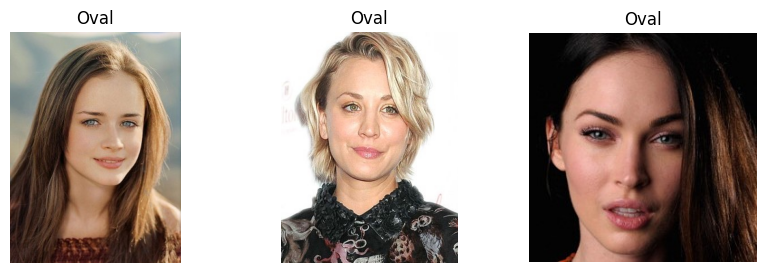

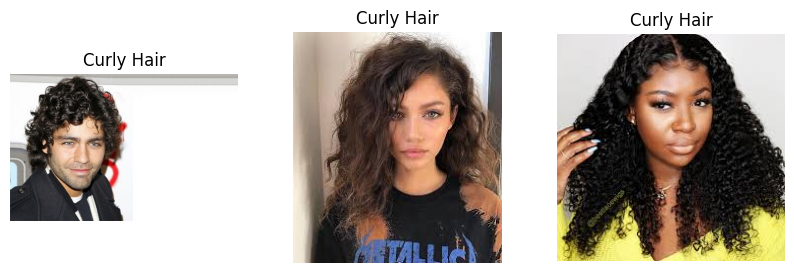

In [7]:
import matplotlib.pyplot as plt
import cv2
import random

# Function to display sample images
def show_sample_images(dataset_path, category_name, num_samples=3):
    category_path = os.path.join(dataset_path, category_name)
    images = os.listdir(category_path)
    sample_images = random.sample(images, min(num_samples, len(images)))

    plt.figure(figsize=(10, 3))
    for i, img_name in enumerate(sample_images):
        img_path = os.path.join(category_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(category_name)
    plt.show()

# Show 3 samples from each dataset
show_sample_images(os.path.join(face_shape_path, "training_set"), "Oval")
show_sample_images(hair_texture_path, "Curly Hair")

In [6]:
!pip install rembg
!pip install onnxruntime

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [ ]:
from rembg import remove
from PIL import Image
import os
import matplotlib.pyplot as plt
from tqdm import tqdm  # Progress bar

# Paths for Jupyter Notebook
face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/FaceShape Dataset"
processed_face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape"

# Create separate directories for processed training and testing images
train_processed_path = os.path.join(processed_face_shape_path, "training_set")
test_processed_path = os.path.join(processed_face_shape_path, "testing_set")

# Ensure storage directories exist
os.makedirs(train_processed_path, exist_ok=True)
os.makedirs(test_processed_path, exist_ok=True)

# Resize images before processing for speed
RESIZE_DIM = (512, 512)

def process_image(img_path, save_img_path):
    """Removes background and saves image."""
    try:
        os.makedirs(os.path.dirname(save_img_path), exist_ok=True)  # Create folder if not exists

        with Image.open(img_path) as img:
            img = img.convert("RGBA").resize(RESIZE_DIM)  # Resize before processing
            output = remove(img)  # Remove background
            output = output.convert("RGB")  # Convert back to RGB
            output.save(save_img_path)  # Save processed image
            return output
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None

def remove_background_and_save(dataset_type, dataset_path, save_path):
    """Processes all images in a dataset and stores them in separate folders."""
    sample_images = []

    for category in os.listdir(dataset_path):
        category_path = os.path.join(dataset_path, category)
        save_category_path = os.path.join(save_path, category)
        os.makedirs(save_category_path, exist_ok=True)

        images = os.listdir(category_path)

        print(f"\nProcessing Category: {category} ({len(images)} images)")

        for img_name in tqdm(images, desc=f"Removing Background from {category}"):  
            img_path = os.path.join(category_path, img_name)
            save_img_path = os.path.join(save_category_path, img_name)
            
            result = process_image(img_path, save_img_path)  # Process image
            if result and len(sample_images) < 3:
                sample_images.append(result)

    return sample_images

# Apply background removal to training and testing sets (saving them separately)
train_samples = remove_background_and_save("training_set", os.path.join(face_shape_path, "training_set"), train_processed_path)
test_samples = remove_background_and_save("testing_set", os.path.join(face_shape_path, "testing_set"), test_processed_path)

# Visualize some processed images
fig, ax = plt.subplots(1, 3, figsize=(10, 5))
for i, img in enumerate(train_samples[:3]):  # Show first 3 from training set
    ax[i].imshow(img)
    ax[i].axis("off")
plt.show()


C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,



Processing Category: Heart (800 images)


Removing Background from Heart:   0%|          | 0/800 [00:00<?, ?it/s]Downloading data from 'https://github.com/danielgatis/rembg/releases/download/v0.0.0/u2net.onnx' to file 'C:\Users\vaibh\.u2net\u2net.onnx'.

  0%|                                               | 0.00/176M [00:00<?, ?B/s]
  1%|2                                      | 984k/176M [00:00<00:18, 9.66MB/s]
  2%|9                                     | 4.21M/176M [00:00<00:07, 22.7MB/s]
  4%|#5                                    | 7.05M/176M [00:00<00:06, 25.2MB/s]
  6%|##1                                   | 9.97M/176M [00:00<00:06, 26.6MB/s]
  7%|##7                                   | 12.6M/176M [00:00<00:08, 19.4MB/s]
  9%|###5                                  | 16.6M/176M [00:00<00:06, 24.9MB/s]
 11%|####2                                 | 19.5M/176M [00:00<00:06, 25.9MB/s]
 13%|####8                                 | 22.3M/176M [00:00<00:06, 23.1MB/s]
 14%|#####4                                | 25.3M/176M [00:01<00:0

Error processing C:/Users/vaibh/Downloads/FACESHAPE/FaceShape Dataset\training_set\Heart\heart (633).jpg: image file is truncated (0 bytes not processed)


Removing Background from Heart: 100%|██████████| 800/800 [20:39<00:00,  1.55s/it]



Processing Category: Oblong (800 images)


Removing Background from Oblong: 100%|██████████| 800/800 [20:35<00:00,  1.54s/it]



Processing Category: Oval (800 images)


Removing Background from Oval: 100%|██████████| 800/800 [20:36<00:00,  1.55s/it]



Processing Category: Round (800 images)


Removing Background from Round: 100%|██████████| 800/800 [20:36<00:00,  1.55s/it]



Processing Category: Square (800 images)


Removing Background from Square:  80%|███████▉  | 636/800 [16:20<04:11,  1.53s/it]

Error processing C:/Users/vaibh/Downloads/FACESHAPE/FaceShape Dataset\training_set\Square\square (84).jpg: image file is truncated (2 bytes not processed)


Removing Background from Square: 100%|██████████| 800/800 [20:32<00:00,  1.54s/it]



Processing Category: Heart (200 images)


Removing Background from Heart: 100%|██████████| 200/200 [05:09<00:00,  1.55s/it]



Processing Category: Oblong (200 images)


Removing Background from Oblong: 100%|██████████| 200/200 [05:08<00:00,  1.54s/it]



Processing Category: Oval (200 images)


Removing Background from Oval: 100%|██████████| 200/200 [05:10<00:00,  1.55s/it]



Processing Category: Round (201 images)


Removing Background from Round:   0%|          | 1/201 [00:00<00:37,  5.30it/s]

Error processing C:/Users/vaibh/Downloads/FACESHAPE/FaceShape Dataset\testing_set\Round\desktop.ini: cannot identify image file 'C:\\Users\\vaibh\\Downloads\\FACESHAPE\\FaceShape Dataset\\testing_set\\Round\\desktop.ini'


Removing Background from Round: 100%|██████████| 201/201 [05:07<00:00,  1.53s/it]



Processing Category: Square (200 images)


Removing Background from Square:  82%|████████▎ | 165/200 [04:14<00:56,  1.60s/it]

In [8]:
from rembg import remove
from PIL import Image
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
import matplotlib.pyplot as plt
import cv2
import random

C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


In [9]:
# Paths for Jupyter Notebook
face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/FaceShape Dataset"
processed_face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape"

# Create separate directories for processed training and testing images
train_processed_path = os.path.join(processed_face_shape_path, "training_set")
test_processed_path = os.path.join(processed_face_shape_path, "testing_set")

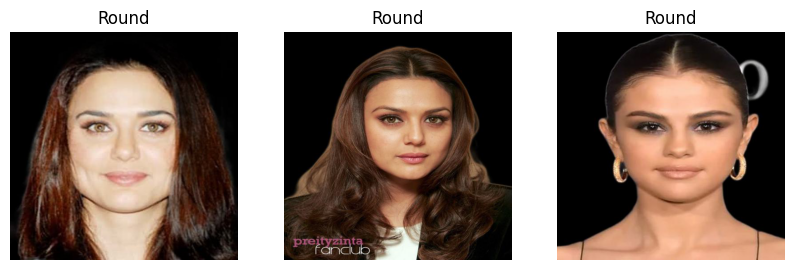

In [10]:
import random

# Pick random samples from the processed training set
sample_category = random.choice(os.listdir(train_processed_path))  # Choose a random category
sample_category_path = os.path.join(train_processed_path, sample_category)
sample_images = random.sample(os.listdir(sample_category_path), min(3, len(os.listdir(sample_category_path))))  # Pick 3 images

# Load and display these images
fig, ax = plt.subplots(1, len(sample_images), figsize=(10, 5))

for i, img_name in enumerate(sample_images):
    img_path = os.path.join(sample_category_path, img_name)
    img = Image.open(img_path)
    ax[i].imshow(img)
    ax[i].axis("off")
    ax[i].set_title(sample_category)

plt.show()

In [11]:
pip install dlib

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.



Processing Category: testing_set\Heart (200 images)


Aligning Faces in testing_set\Heart:   7%|▋         | 14/200 [00:00<00:11, 16.57it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (141).jpg


Aligning Faces in testing_set\Heart:  17%|█▋        | 34/200 [00:02<00:10, 15.48it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (233).jpg


Aligning Faces in testing_set\Heart:  28%|██▊       | 56/200 [00:03<00:09, 15.82it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (336).jpg


Aligning Faces in testing_set\Heart:  45%|████▌     | 90/200 [00:05<00:06, 15.86it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (452).jpg


Aligning Faces in testing_set\Heart:  47%|████▋     | 94/200 [00:06<00:07, 14.85it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (462).jpg


Aligning Faces in testing_set\Heart:  60%|██████    | 120/200 [00:07<00:04, 17.67it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (597).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (603).jpg


Aligning Faces in testing_set\Heart:  64%|██████▍   | 128/200 [00:08<00:04, 16.72it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (624).jpg


Aligning Faces in testing_set\Heart:  71%|███████   | 142/200 [00:08<00:03, 17.24it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (665).jpg


Aligning Faces in testing_set\Heart:  82%|████████▏ | 164/200 [00:10<00:02, 17.13it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (776).jpg


Aligning Faces in testing_set\Heart:  88%|████████▊ | 176/200 [00:10<00:01, 17.13it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (851).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (854).jpg


Aligning Faces in testing_set\Heart:  90%|█████████ | 181/200 [00:11<00:01, 18.05it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (872).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (873).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (892).jpg


Aligning Faces in testing_set\Heart:  92%|█████████▎| 185/200 [00:11<00:00, 17.18it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (910).jpg


Aligning Faces in testing_set\Heart:  96%|█████████▋| 193/200 [00:11<00:00, 17.36it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Heart\heart (923).jpg


Aligning Faces in testing_set\Heart: 100%|██████████| 200/200 [00:12<00:00, 16.27it/s]



Processing Category: testing_set\Oblong (200 images)


Aligning Faces in testing_set\Oblong:   1%|          | 2/200 [00:00<00:12, 15.94it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oblong\oblong (107).jpg


Aligning Faces in testing_set\Oblong:  11%|█         | 22/200 [00:01<00:10, 16.86it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oblong\oblong (156).jpg


Aligning Faces in testing_set\Oblong:  22%|██▏       | 44/200 [00:02<00:10, 15.50it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oblong\oblong (314).jpg


Aligning Faces in testing_set\Oblong:  44%|████▍     | 88/200 [00:05<00:07, 15.56it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oblong\oblong (552).jpg


Aligning Faces in testing_set\Oblong:  63%|██████▎   | 126/200 [00:07<00:04, 16.98it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oblong\oblong (697).jpg


Aligning Faces in testing_set\Oblong:  86%|████████▌ | 172/200 [00:10<00:01, 16.12it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oblong\oblong (905).jpg


Aligning Faces in testing_set\Oblong: 100%|██████████| 200/200 [00:12<00:00, 15.89it/s]


No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oblong\oblong (997).jpg

Processing Category: testing_set\Oval (200 images)


Aligning Faces in testing_set\Oval:   6%|▌         | 12/200 [00:00<00:12, 14.95it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (16).jpg


Aligning Faces in testing_set\Oval:   9%|▉         | 18/200 [00:01<00:11, 15.68it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (201).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (206).jpg


Aligning Faces in testing_set\Oval:  14%|█▍        | 28/200 [00:01<00:12, 14.06it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (25).jpg


Aligning Faces in testing_set\Oval:  46%|████▌     | 92/200 [00:05<00:06, 15.95it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (438).jpg


Aligning Faces in testing_set\Oval:  72%|███████▏  | 143/200 [00:09<00:03, 16.53it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (651).jpg


Aligning Faces in testing_set\Oval:  76%|███████▌  | 152/200 [00:09<00:02, 18.04it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (662).jpg


Aligning Faces in testing_set\Oval:  78%|███████▊  | 156/200 [00:09<00:02, 17.49it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (675).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (679).jpg


Aligning Faces in testing_set\Oval:  82%|████████▏ | 164/200 [00:10<00:02, 16.17it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (684).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (687).jpg


Aligning Faces in testing_set\Oval:  85%|████████▌ | 170/200 [00:10<00:01, 16.37it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (690).jpg


Aligning Faces in testing_set\Oval:  88%|████████▊ | 176/200 [00:11<00:01, 15.92it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (696).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (698).jpg


Aligning Faces in testing_set\Oval:  99%|█████████▉| 198/200 [00:12<00:00, 16.26it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Oval\oval (896).jpg


Aligning Faces in testing_set\Oval: 100%|██████████| 200/200 [00:12<00:00, 15.74it/s]



Processing Category: testing_set\Round (200 images)


Aligning Faces in testing_set\Round:   5%|▌         | 10/200 [00:00<00:11, 16.21it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (144).jpg


Aligning Faces in testing_set\Round:  12%|█▏        | 24/200 [00:01<00:11, 15.68it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (18).jpg


Aligning Faces in testing_set\Round:  17%|█▋        | 34/200 [00:02<00:10, 15.66it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (261).jpg


Aligning Faces in testing_set\Round:  21%|██        | 42/200 [00:02<00:10, 15.49it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (271).jpg


Aligning Faces in testing_set\Round:  24%|██▍       | 48/200 [00:03<00:10, 14.71it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (281).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (299).jpg


Aligning Faces in testing_set\Round:  29%|██▉       | 58/200 [00:03<00:09, 15.47it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (351).jpg


Aligning Faces in testing_set\Round:  56%|█████▌    | 112/200 [00:07<00:05, 15.44it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (563).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (569).jpg


Aligning Faces in testing_set\Round:  58%|█████▊    | 116/200 [00:07<00:05, 15.92it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (597).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (598).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (599).jpg


Aligning Faces in testing_set\Round:  60%|██████    | 120/200 [00:07<00:04, 16.15it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (600).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (604).jpg


Aligning Faces in testing_set\Round:  62%|██████▏   | 124/200 [00:08<00:05, 14.82it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (606).jpg


Aligning Faces in testing_set\Round:  64%|██████▍   | 128/200 [00:08<00:04, 15.56it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (61).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (610).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (611).jpg


Aligning Faces in testing_set\Round:  66%|██████▌   | 132/200 [00:08<00:04, 15.56it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (675).jpg


Aligning Faces in testing_set\Round:  69%|██████▉   | 138/200 [00:09<00:03, 15.53it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (743).jpg


Aligning Faces in testing_set\Round:  77%|███████▋  | 154/200 [00:10<00:02, 15.35it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (87).jpg


Aligning Faces in testing_set\Round:  79%|███████▉  | 158/200 [00:10<00:02, 14.44it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (89).jpg


Aligning Faces in testing_set\Round:  86%|████████▌ | 172/200 [00:11<00:01, 15.41it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (92).jpg


Aligning Faces in testing_set\Round:  88%|████████▊ | 176/200 [00:11<00:01, 15.61it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (947).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (950).jpg


Aligning Faces in testing_set\Round:  91%|█████████ | 182/200 [00:12<00:01, 15.98it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (953).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (96).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (97).jpg


Aligning Faces in testing_set\Round:  95%|█████████▌| 190/200 [00:12<00:00, 15.35it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (984).jpg


Aligning Faces in testing_set\Round:  97%|█████████▋| 194/200 [00:12<00:00, 15.15it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Round\round (989).jpg


Aligning Faces in testing_set\Round: 100%|██████████| 200/200 [00:13<00:00, 15.20it/s]



Processing Category: testing_set\Square (200 images)


Aligning Faces in testing_set\Square:   8%|▊         | 16/200 [00:01<00:12, 15.31it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (154).jpg


Aligning Faces in testing_set\Square:  21%|██        | 42/200 [00:02<00:09, 15.81it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (241).jpg


Aligning Faces in testing_set\Square:  24%|██▍       | 48/200 [00:03<00:09, 16.79it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (298).jpg


Aligning Faces in testing_set\Square:  32%|███▏      | 64/200 [00:04<00:08, 16.37it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (403).jpg


Aligning Faces in testing_set\Square:  44%|████▍     | 88/200 [00:05<00:07, 15.15it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (465).jpg


Aligning Faces in testing_set\Square:  62%|██████▏   | 124/200 [00:07<00:04, 16.61it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (6).jpg


Aligning Faces in testing_set\Square:  68%|██████▊   | 136/200 [00:08<00:03, 16.00it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (629).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (631).jpg


Aligning Faces in testing_set\Square:  74%|███████▍  | 148/200 [00:09<00:03, 15.79it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (674).jpg


Aligning Faces in testing_set\Square:  78%|███████▊  | 156/200 [00:09<00:02, 15.81it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (680).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (683).jpg


Aligning Faces in testing_set\Square:  80%|████████  | 160/200 [00:10<00:02, 16.23it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (684).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\testing_set\Square\square (686).jpg


Aligning Faces in testing_set\Square: 100%|██████████| 200/200 [00:12<00:00, 15.56it/s]



Processing Category: training_set\Heart (799 images)


Aligning Faces in training_set\Heart:   3%|▎         | 20/799 [00:01<01:01, 12.71it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (115).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (117).jpg


Aligning Faces in training_set\Heart:   3%|▎         | 26/799 [00:01<00:56, 13.72it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (120).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (121).jpg


Aligning Faces in training_set\Heart:   8%|▊         | 64/799 [00:04<00:51, 14.27it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (167).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (169).jpg


Aligning Faces in training_set\Heart:   9%|▉         | 70/799 [00:05<00:52, 13.91it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (172).jpg


Aligning Faces in training_set\Heart:  12%|█▏        | 98/799 [00:07<00:50, 13.78it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (202).jpg


Aligning Faces in training_set\Heart:  14%|█▍        | 112/799 [00:08<00:50, 13.49it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (217).jpg


Aligning Faces in training_set\Heart:  15%|█▌        | 122/799 [00:08<00:48, 14.04it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (232).jpg


Aligning Faces in training_set\Heart:  19%|█▉        | 152/799 [00:11<00:46, 14.00it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (27).jpg


Aligning Faces in training_set\Heart:  27%|██▋       | 216/799 [00:16<00:42, 13.69it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (338).jpg


Aligning Faces in training_set\Heart:  28%|██▊       | 220/799 [00:16<00:43, 13.38it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (342).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (345).jpg


Aligning Faces in training_set\Heart:  28%|██▊       | 226/799 [00:16<00:40, 14.16it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (35).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (351).jpg


Aligning Faces in training_set\Heart:  32%|███▏      | 252/799 [00:18<00:36, 15.05it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (380).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (383).jpg


Aligning Faces in training_set\Heart:  33%|███▎      | 260/799 [00:19<00:37, 14.36it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (391).jpg


Aligning Faces in training_set\Heart:  34%|███▎      | 268/799 [00:19<00:37, 14.12it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (4).jpg


Aligning Faces in training_set\Heart:  36%|███▌      | 286/799 [00:21<00:36, 14.05it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (423).jpg


Aligning Faces in training_set\Heart:  43%|████▎     | 340/799 [00:24<00:33, 13.83it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (492).jpg


Aligning Faces in training_set\Heart:  47%|████▋     | 378/799 [00:27<00:32, 13.11it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (533).jpg


Aligning Faces in training_set\Heart:  53%|█████▎    | 426/799 [00:31<00:29, 12.47it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (585).jpg


Aligning Faces in training_set\Heart:  57%|█████▋    | 452/799 [00:33<00:27, 12.60it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (613).jpg


Aligning Faces in training_set\Heart:  59%|█████▊    | 468/799 [00:34<00:24, 13.56it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (630).jpg


Aligning Faces in training_set\Heart:  68%|██████▊   | 540/799 [00:39<00:17, 14.41it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (72).jpg


Aligning Faces in training_set\Heart:  68%|██████▊   | 544/799 [00:40<00:18, 13.70it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (723).jpg


Aligning Faces in training_set\Heart:  71%|███████   | 564/799 [00:41<00:18, 12.63it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (744).jpg


Aligning Faces in training_set\Heart:  73%|███████▎  | 586/799 [00:43<00:15, 13.79it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (77).jpg


Aligning Faces in training_set\Heart:  77%|███████▋  | 618/799 [00:46<00:14, 12.52it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (809).jpg


Aligning Faces in training_set\Heart:  78%|███████▊  | 622/799 [00:46<00:14, 12.54it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (812).jpg


Aligning Faces in training_set\Heart:  81%|████████▏ | 650/799 [00:48<00:09, 15.04it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (837).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (839).jpg


Aligning Faces in training_set\Heart:  82%|████████▏ | 658/799 [00:49<00:09, 14.61it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (845).jpg


Aligning Faces in training_set\Heart:  83%|████████▎ | 664/799 [00:49<00:09, 14.41it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (85).jpg


Aligning Faces in training_set\Heart:  84%|████████▎ | 668/799 [00:49<00:09, 14.52it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (857).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (858).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (859).jpg


Aligning Faces in training_set\Heart:  84%|████████▍ | 672/799 [00:50<00:08, 14.88it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (860).jpg


Aligning Faces in training_set\Heart:  86%|████████▌ | 686/799 [00:51<00:08, 12.67it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (876).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (877).jpg


Aligning Faces in training_set\Heart:  86%|████████▌ | 688/799 [00:51<00:08, 12.53it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (879).jpg


Aligning Faces in training_set\Heart:  87%|████████▋ | 692/799 [00:51<00:08, 13.17it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (881).jpg


Aligning Faces in training_set\Heart:  88%|████████▊ | 704/799 [00:52<00:08, 11.54it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (893).jpg


Aligning Faces in training_set\Heart:  89%|████████▊ | 708/799 [00:53<00:07, 11.69it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (898).jpg


Aligning Faces in training_set\Heart:  90%|████████▉ | 716/799 [00:53<00:07, 11.76it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (904).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (906).jpg


Aligning Faces in training_set\Heart:  90%|█████████ | 720/799 [00:54<00:06, 12.61it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (908).jpg


Aligning Faces in training_set\Heart:  94%|█████████▍| 752/799 [00:56<00:03, 12.76it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (950).jpg


Aligning Faces in training_set\Heart:  95%|█████████▌| 760/799 [00:57<00:03, 12.94it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (957).jpg


Aligning Faces in training_set\Heart:  95%|█████████▌| 762/799 [00:57<00:02, 12.82it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (96).jpg


Aligning Faces in training_set\Heart:  99%|█████████▉| 790/799 [00:59<00:00, 11.69it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (988).jpg


Aligning Faces in training_set\Heart:  99%|█████████▉| 794/799 [01:00<00:00, 12.24it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (991).jpg


Aligning Faces in training_set\Heart: 100%|█████████▉| 796/799 [01:00<00:00, 12.16it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Heart\heart (994).jpg


Aligning Faces in training_set\Heart: 100%|██████████| 799/799 [01:00<00:00, 13.20it/s]



Processing Category: training_set\Oblong (800 images)


Aligning Faces in training_set\Oblong:   4%|▍         | 36/800 [00:03<01:10, 10.85it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (133).jpg


Aligning Faces in training_set\Oblong:   9%|▉         | 74/800 [00:07<01:05, 11.00it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (185).jpg


Aligning Faces in training_set\Oblong:  13%|█▎        | 102/800 [00:09<01:08, 10.24it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (214).jpg


Aligning Faces in training_set\Oblong:  16%|█▋        | 130/800 [00:12<00:55, 12.04it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (244).jpg


Aligning Faces in training_set\Oblong:  25%|██▌       | 200/800 [00:18<00:56, 10.56it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (312).jpg


Aligning Faces in training_set\Oblong:  26%|██▌       | 208/800 [00:19<00:53, 11.12it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (334).jpg


Aligning Faces in training_set\Oblong:  26%|██▋       | 212/800 [00:19<00:51, 11.40it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (340).jpg


Aligning Faces in training_set\Oblong:  29%|██▉       | 234/800 [00:21<00:51, 10.98it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (362).jpg


Aligning Faces in training_set\Oblong:  35%|███▍      | 278/800 [00:25<00:47, 10.91it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (404).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (405).jpg


Aligning Faces in training_set\Oblong:  38%|███▊      | 302/800 [00:27<00:45, 11.05it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (427).jpg


Aligning Faces in training_set\Oblong:  39%|███▉      | 310/800 [00:28<00:39, 12.46it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (434).jpg


Aligning Faces in training_set\Oblong:  40%|████      | 324/800 [00:29<00:43, 11.00it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (448).jpg


Aligning Faces in training_set\Oblong:  47%|████▋     | 378/800 [00:34<00:39, 10.76it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (502).jpg


Aligning Faces in training_set\Oblong:  54%|█████▎    | 428/800 [00:39<00:30, 12.31it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (567).jpg


Aligning Faces in training_set\Oblong:  68%|██████▊   | 547/800 [00:51<00:31,  7.96it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (712).jpg


Aligning Faces in training_set\Oblong:  74%|███████▍  | 592/800 [00:56<00:21,  9.46it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (753).jpg


Aligning Faces in training_set\Oblong:  79%|███████▉  | 633/800 [01:01<00:11, 14.03it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (79).jpg


Aligning Faces in training_set\Oblong:  80%|███████▉  | 637/800 [01:01<00:21,  7.59it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (794).jpg


Aligning Faces in training_set\Oblong:  81%|████████  | 649/800 [01:21<03:25,  1.36s/it]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (807).jpg


Aligning Faces in training_set\Oblong:  92%|█████████▏| 737/800 [02:00<00:06,  9.88it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oblong\oblong (932).jpg


Aligning Faces in training_set\Oblong: 100%|██████████| 800/800 [02:09<00:00,  6.19it/s]



Processing Category: training_set\Oval (800 images)


Aligning Faces in training_set\Oval:   3%|▎         | 24/800 [00:03<01:44,  7.45it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (12).jpg


Aligning Faces in training_set\Oval:   5%|▌         | 41/800 [00:05<01:10, 10.76it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (135).jpg


Aligning Faces in training_set\Oval:   6%|▌         | 47/800 [00:05<01:02, 11.96it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (14).jpg


Aligning Faces in training_set\Oval:   9%|▉         | 71/800 [00:07<00:58, 12.42it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (169).jpg


Aligning Faces in training_set\Oval:  11%|█         | 89/800 [00:09<00:57, 12.38it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (185).jpg


Aligning Faces in training_set\Oval:  13%|█▎        | 105/800 [00:10<00:56, 12.40it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (208).jpg


Aligning Faces in training_set\Oval:  16%|█▋        | 131/800 [00:12<00:50, 13.14it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (234).jpg


Aligning Faces in training_set\Oval:  18%|█▊        | 143/800 [00:13<00:55, 11.78it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (247).jpg


Aligning Faces in training_set\Oval:  20%|█▉        | 157/800 [00:14<00:52, 12.22it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (265).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (266).jpg


Aligning Faces in training_set\Oval:  20%|██        | 161/800 [00:15<00:54, 11.78it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (269).jpg


Aligning Faces in training_set\Oval:  22%|██▏       | 175/800 [00:16<00:51, 12.14it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (301).jpg


Aligning Faces in training_set\Oval:  23%|██▎       | 181/800 [00:16<00:47, 13.06it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (309).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (310).jpg


Aligning Faces in training_set\Oval:  24%|██▍       | 193/800 [00:17<00:49, 12.19it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (320).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (322).jpg


Aligning Faces in training_set\Oval:  25%|██▍       | 197/800 [00:18<00:49, 12.09it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (324).jpg


Aligning Faces in training_set\Oval:  28%|██▊       | 225/800 [00:20<00:46, 12.31it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (349).jpg


Aligning Faces in training_set\Oval:  34%|███▎      | 269/800 [00:23<00:45, 11.76it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (416).jpg


Aligning Faces in training_set\Oval:  35%|███▌      | 283/800 [00:25<00:43, 11.90it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (43).jpg


Aligning Faces in training_set\Oval:  36%|███▋      | 291/800 [00:25<00:41, 12.26it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (44).jpg


Aligning Faces in training_set\Oval:  46%|████▌     | 369/800 [00:32<00:35, 12.14it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (54).jpg


Aligning Faces in training_set\Oval:  48%|████▊     | 381/800 [00:33<00:35, 11.75it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (551).jpg


Aligning Faces in training_set\Oval:  51%|█████     | 409/800 [00:35<00:29, 13.11it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (581).jpg


Aligning Faces in training_set\Oval:  52%|█████▏    | 417/800 [00:35<00:28, 13.65it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (589).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (590).jpg


Aligning Faces in training_set\Oval:  53%|█████▎    | 425/800 [00:36<00:28, 13.36it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (597).jpg


Aligning Faces in training_set\Oval:  55%|█████▍    | 439/800 [00:37<00:27, 13.03it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (611).jpg


Aligning Faces in training_set\Oval:  58%|█████▊    | 461/800 [00:39<00:25, 13.07it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (635).jpg


Aligning Faces in training_set\Oval:  60%|██████    | 481/800 [00:40<00:21, 15.07it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (665).jpg


Aligning Faces in training_set\Oval:  61%|██████    | 485/800 [00:40<00:20, 15.49it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (669).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (670).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (671).jpg


Aligning Faces in training_set\Oval:  63%|██████▎   | 501/800 [00:42<00:21, 13.94it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (707).jpg


Aligning Faces in training_set\Oval:  65%|██████▍   | 519/800 [00:43<00:20, 13.63it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (723).jpg


Aligning Faces in training_set\Oval:  66%|██████▋   | 531/800 [00:44<00:20, 13.28it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (735).jpg


Aligning Faces in training_set\Oval:  68%|██████▊   | 543/800 [00:45<00:18, 13.70it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (746).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (748).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (749).jpg


Aligning Faces in training_set\Oval:  68%|██████▊   | 547/800 [00:45<00:18, 13.99it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (75).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (750).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (751).jpg


Aligning Faces in training_set\Oval:  70%|██████▉   | 559/800 [00:46<00:17, 13.66it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (760).jpg


Aligning Faces in training_set\Oval:  76%|███████▋  | 611/800 [00:50<00:14, 13.31it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (814).jpg


Aligning Faces in training_set\Oval:  80%|███████▉  | 639/800 [00:52<00:11, 14.35it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (842).jpg


Aligning Faces in training_set\Oval:  84%|████████▎ | 669/800 [00:54<00:10, 12.84it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (87).jpg


Aligning Faces in training_set\Oval:  87%|████████▋ | 693/800 [00:56<00:07, 13.71it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (897).jpg


Aligning Faces in training_set\Oval:  96%|█████████▌| 765/800 [01:01<00:02, 13.09it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Oval\oval (964).jpg


Aligning Faces in training_set\Oval: 100%|██████████| 800/800 [01:04<00:00, 12.41it/s]



Processing Category: training_set\Round (800 images)


Aligning Faces in training_set\Round:   2%|▏         | 18/800 [00:01<00:54, 14.31it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (114).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (115).jpg


Aligning Faces in training_set\Round:   6%|▋         | 50/800 [00:03<00:48, 15.43it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (148).jpg


Aligning Faces in training_set\Round:   9%|▉         | 70/800 [00:04<00:48, 15.04it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (176).jpg


Aligning Faces in training_set\Round:  11%|█         | 86/800 [00:05<00:47, 15.11it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (194).jpg


Aligning Faces in training_set\Round:  11%|█▏        | 90/800 [00:05<00:44, 15.94it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (198).jpg


Aligning Faces in training_set\Round:  12%|█▏        | 96/800 [00:06<00:47, 14.88it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (204).jpg


Aligning Faces in training_set\Round:  14%|█▎        | 108/800 [00:07<00:45, 15.09it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (217).jpg


Aligning Faces in training_set\Round:  15%|█▍        | 118/800 [00:07<00:44, 15.38it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (225).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (228).jpg


Aligning Faces in training_set\Round:  16%|█▌        | 126/800 [00:08<00:42, 15.97it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (234).jpg


Aligning Faces in training_set\Round:  17%|█▋        | 138/800 [00:09<00:39, 16.78it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (245).jpg


Aligning Faces in training_set\Round:  18%|█▊        | 142/800 [00:09<00:39, 16.72it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (25).jpg


Aligning Faces in training_set\Round:  18%|█▊        | 146/800 [00:09<00:40, 15.97it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (253).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (254).jpg


Aligning Faces in training_set\Round:  19%|█▉        | 154/800 [00:10<00:39, 16.28it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (26).jpg


Aligning Faces in training_set\Round:  20%|█▉        | 158/800 [00:10<00:40, 15.92it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (280).jpg


Aligning Faces in training_set\Round:  20%|██        | 162/800 [00:10<00:43, 14.73it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (285).jpg


Aligning Faces in training_set\Round:  22%|██▏       | 176/800 [00:11<00:37, 16.51it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (297).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (30).jpg


Aligning Faces in training_set\Round:  22%|██▎       | 180/800 [00:11<00:38, 15.96it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (302).jpg


Aligning Faces in training_set\Round:  24%|██▍       | 196/800 [00:12<00:35, 16.89it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (317).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (318).jpg


Aligning Faces in training_set\Round:  26%|██▌       | 204/800 [00:13<00:36, 16.49it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (324).jpg


Aligning Faces in training_set\Round:  26%|██▌       | 208/800 [00:13<00:35, 16.60it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (328).jpg


Aligning Faces in training_set\Round:  26%|██▋       | 212/800 [00:13<00:34, 16.86it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (332).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (335).jpg


Aligning Faces in training_set\Round:  27%|██▋       | 218/800 [00:14<00:35, 16.38it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (339).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (34).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (340).jpg


Aligning Faces in training_set\Round:  28%|██▊       | 222/800 [00:14<00:34, 16.52it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (342).jpg


Aligning Faces in training_set\Round:  28%|██▊       | 226/800 [00:14<00:34, 16.69it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (346).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (347).jpg


Aligning Faces in training_set\Round:  30%|███       | 242/800 [00:15<00:34, 15.98it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (372).jpg


Aligning Faces in training_set\Round:  31%|███       | 248/800 [00:15<00:33, 16.37it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (38).jpg


Aligning Faces in training_set\Round:  32%|███▏      | 252/800 [00:16<00:35, 15.65it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (383).jpg


Aligning Faces in training_set\Round:  32%|███▏      | 258/800 [00:16<00:35, 15.23it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (390).jpg


Aligning Faces in training_set\Round:  34%|███▎      | 268/800 [00:17<00:34, 15.59it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (40).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (402).jpg


Aligning Faces in training_set\Round:  34%|███▍      | 272/800 [00:17<00:32, 16.10it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (404).jpg


Aligning Faces in training_set\Round:  35%|███▌      | 280/800 [00:17<00:32, 16.09it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (411).jpg


Aligning Faces in training_set\Round:  36%|███▌      | 286/800 [00:18<00:31, 16.23it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (417).jpg


Aligning Faces in training_set\Round:  37%|███▋      | 298/800 [00:19<00:31, 16.02it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (443).jpg


Aligning Faces in training_set\Round:  40%|███▉      | 316/800 [00:20<00:29, 16.19it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (462).jpg


Aligning Faces in training_set\Round:  44%|████▎     | 348/800 [00:22<00:28, 15.97it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (495).jpg


Aligning Faces in training_set\Round:  44%|████▍     | 354/800 [00:22<00:28, 15.73it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (500).jpg


Aligning Faces in training_set\Round:  46%|████▋     | 372/800 [00:23<00:27, 15.67it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (527).jpg


Aligning Faces in training_set\Round:  52%|█████▏    | 416/800 [00:26<00:23, 16.12it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (57).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (570).jpg


Aligning Faces in training_set\Round:  55%|█████▌    | 442/800 [00:28<00:22, 16.22it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (594).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (595).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (601).jpg


Aligning Faces in training_set\Round:  56%|█████▌    | 448/800 [00:28<00:21, 16.60it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (614).jpg


Aligning Faces in training_set\Round:  57%|█████▋    | 458/800 [00:29<00:20, 16.35it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (622).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (623).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (624).jpg


Aligning Faces in training_set\Round:  58%|█████▊    | 462/800 [00:29<00:20, 16.59it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (627).jpg


Aligning Faces in training_set\Round:  58%|█████▊    | 468/800 [00:29<00:19, 17.14it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (632).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (633).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (634).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (635).jpg


Aligning Faces in training_set\Round:  59%|█████▉    | 474/800 [00:30<00:19, 16.66it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (637).jpg


Aligning Faces in training_set\Round:  60%|█████▉    | 478/800 [00:30<00:18, 17.66it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (640).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (641).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (642).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (643).jpg


Aligning Faces in training_set\Round:  60%|██████    | 482/800 [00:30<00:17, 17.74it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (644).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (645).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (646).jpg


Aligning Faces in training_set\Round:  61%|██████    | 486/800 [00:30<00:18, 16.77it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (649).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (650).jpg


Aligning Faces in training_set\Round:  61%|██████    | 488/800 [00:31<00:20, 15.58it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (651).jpg


Aligning Faces in training_set\Round:  62%|██████▏   | 492/800 [00:31<00:19, 16.21it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (654).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (656).jpg


Aligning Faces in training_set\Round:  62%|██████▏   | 496/800 [00:31<00:19, 15.99it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (658).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (660).jpg


Aligning Faces in training_set\Round:  62%|██████▎   | 500/800 [00:31<00:19, 15.69it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (661).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (662).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (663).jpg


Aligning Faces in training_set\Round:  63%|██████▎   | 506/800 [00:32<00:18, 15.54it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (666).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (667).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (669).jpg


Aligning Faces in training_set\Round:  64%|██████▍   | 512/800 [00:32<00:18, 15.98it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (672).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (676).jpg


Aligning Faces in training_set\Round:  65%|██████▍   | 518/800 [00:33<00:17, 16.30it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (678).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (679).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (680).jpg


Aligning Faces in training_set\Round:  66%|██████▋   | 532/800 [00:33<00:16, 16.54it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (691).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (692).jpg


Aligning Faces in training_set\Round:  67%|██████▋   | 536/800 [00:34<00:16, 16.39it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (695).jpg


Aligning Faces in training_set\Round:  71%|███████▏  | 570/800 [00:36<00:13, 16.89it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (727).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (728).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (73).jpg


Aligning Faces in training_set\Round:  72%|███████▏  | 574/800 [00:36<00:13, 16.35it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (731).jpg


Aligning Faces in training_set\Round:  78%|███████▊  | 624/800 [00:39<00:11, 14.82it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (787).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (789).jpg


Aligning Faces in training_set\Round:  78%|███████▊  | 628/800 [00:40<00:11, 15.28it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (792).jpg


Aligning Faces in training_set\Round:  81%|████████▏ | 650/800 [00:41<00:09, 15.97it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (812).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (813).jpg


Aligning Faces in training_set\Round:  82%|████████▏ | 656/800 [00:41<00:09, 15.93it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (818).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (819).jpg


Aligning Faces in training_set\Round:  83%|████████▎ | 662/800 [00:42<00:09, 15.33it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (823).jpg


Aligning Faces in training_set\Round:  83%|████████▎ | 666/800 [00:42<00:08, 16.04it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (828).jpg


Aligning Faces in training_set\Round:  85%|████████▍ | 678/800 [00:43<00:08, 14.57it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (839).jpg


Aligning Faces in training_set\Round:  86%|████████▌ | 688/800 [00:43<00:06, 16.11it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (850).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (851).jpg


Aligning Faces in training_set\Round:  89%|████████▉ | 710/800 [00:45<00:05, 15.70it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (872).jpg


Aligning Faces in training_set\Round:  90%|█████████ | 722/800 [00:46<00:04, 16.12it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (885).jpg


Aligning Faces in training_set\Round:  92%|█████████▏| 732/800 [00:46<00:04, 15.89it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (905).jpg


Aligning Faces in training_set\Round:  92%|█████████▏| 736/800 [00:46<00:03, 16.02it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (909).jpg


Aligning Faces in training_set\Round:  94%|█████████▎| 748/800 [00:47<00:03, 15.91it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (921).jpg


Aligning Faces in training_set\Round:  96%|█████████▌| 766/800 [00:48<00:02, 15.67it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (938).jpg


Aligning Faces in training_set\Round:  97%|█████████▋| 778/800 [00:49<00:01, 14.58it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (958).jpg


Aligning Faces in training_set\Round: 100%|█████████▉| 796/800 [00:50<00:00, 15.68it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Round\round (976).jpg


Aligning Faces in training_set\Round: 100%|██████████| 800/800 [00:51<00:00, 15.66it/s]



Processing Category: training_set\Square (799 images)


Aligning Faces in training_set\Square:   4%|▍         | 32/799 [00:02<00:49, 15.39it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (125).jpg


Aligning Faces in training_set\Square:   7%|▋         | 56/799 [00:03<00:45, 16.22it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (164).jpg


Aligning Faces in training_set\Square:  14%|█▍        | 110/799 [00:06<00:44, 15.58it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (216).jpg


Aligning Faces in training_set\Square:  16%|█▌        | 128/799 [00:08<00:44, 15.00it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (247).jpg


Aligning Faces in training_set\Square:  17%|█▋        | 136/799 [00:08<00:42, 15.61it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (254).jpg


Aligning Faces in training_set\Square:  18%|█▊        | 142/799 [00:09<00:41, 15.65it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (260).jpg


Aligning Faces in training_set\Square:  19%|█▉        | 152/799 [00:09<00:41, 15.64it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (27).jpg


Aligning Faces in training_set\Square:  30%|███       | 240/799 [00:15<00:34, 16.13it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (361).jpg


Aligning Faces in training_set\Square:  31%|███       | 248/799 [00:15<00:34, 16.14it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (371).jpg


Aligning Faces in training_set\Square:  38%|███▊      | 302/799 [00:19<00:32, 15.18it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (434).jpg


Aligning Faces in training_set\Square:  41%|████▏     | 330/799 [00:21<00:31, 15.11it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (476).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (478).jpg


Aligning Faces in training_set\Square:  46%|████▌     | 366/799 [00:23<00:28, 15.44it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (52).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (53).jpg


Aligning Faces in training_set\Square:  53%|█████▎    | 426/799 [00:27<00:25, 14.35it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (587).jpg


Aligning Faces in training_set\Square:  57%|█████▋    | 452/799 [00:29<00:23, 14.71it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (615).jpg


Aligning Faces in training_set\Square:  57%|█████▋    | 456/799 [00:29<00:21, 15.90it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (618).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (620).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (628).jpg


Aligning Faces in training_set\Square:  59%|█████▊    | 468/799 [00:30<00:20, 16.08it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (644).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (645).jpg


Aligning Faces in training_set\Square:  59%|█████▉    | 474/799 [00:30<00:20, 16.16it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (650).jpg
No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (653).jpg


Aligning Faces in training_set\Square:  60%|██████    | 480/799 [00:31<00:20, 15.79it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (656).jpg


Aligning Faces in training_set\Square:  62%|██████▏   | 494/799 [00:32<00:19, 15.48it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (670).jpg


Aligning Faces in training_set\Square:  63%|██████▎   | 504/799 [00:32<00:18, 15.95it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (698).jpg


Aligning Faces in training_set\Square:  65%|██████▌   | 520/799 [00:33<00:18, 15.12it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (712).jpg


Aligning Faces in training_set\Square:  66%|██████▌   | 524/799 [00:33<00:17, 15.54it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (718).jpg


Aligning Faces in training_set\Square:  67%|██████▋   | 532/799 [00:34<00:17, 15.67it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (723).jpg


Aligning Faces in training_set\Square:  69%|██████▉   | 552/799 [00:35<00:16, 15.01it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (742).jpg


Aligning Faces in training_set\Square:  72%|███████▏  | 572/799 [00:36<00:13, 16.69it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (761).jpg


Aligning Faces in training_set\Square:  73%|███████▎  | 580/799 [00:37<00:13, 15.91it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (78).jpg


Aligning Faces in training_set\Square:  73%|███████▎  | 584/799 [00:37<00:13, 16.21it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (783).jpg


Aligning Faces in training_set\Square:  74%|███████▎  | 588/799 [00:37<00:12, 16.23it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (787).jpg


Aligning Faces in training_set\Square:  82%|████████▏ | 654/799 [00:42<00:08, 16.85it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (854).jpg


Aligning Faces in training_set\Square:  86%|████████▌ | 688/799 [00:44<00:06, 16.65it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (885).jpg


Aligning Faces in training_set\Square:  97%|█████████▋| 774/799 [00:49<00:01, 15.21it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (973).jpg


Aligning Faces in training_set\Square:  97%|█████████▋| 778/799 [00:49<00:01, 14.70it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (979).jpg


Aligning Faces in training_set\Square:  99%|█████████▊| 788/799 [00:50<00:00, 15.16it/s]

No face detected in C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape\training_set\Square\square (987).jpg


Aligning Faces in training_set\Square: 100%|██████████| 799/799 [00:50<00:00, 15.71it/s]


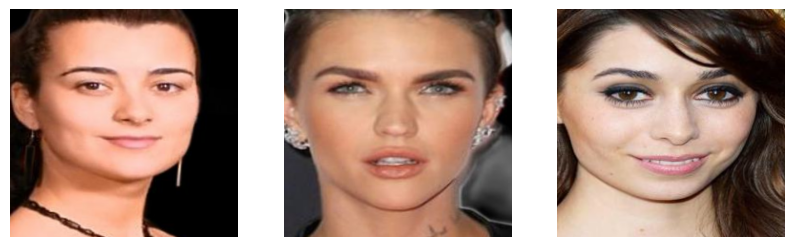

In [13]:
import dlib
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # Progress bar

# Paths (Ensure these match your Jupyter Notebook environment)
processed_face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/Processed_FaceShape"
aligned_face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape"
landmark_model_path = "C:/Users/vaibh/shape_predictor_68_face_landmarks.dat"  # Ensure correct path

# Create directory for aligned images
os.makedirs(aligned_face_shape_path, exist_ok=True)

# Load dlib face detector and landmark predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(landmark_model_path)

def align_and_crop_face(image_path, save_path):
    """Aligns and crops a face from the image, then saves it."""
    try:
        # Validate file existence
        if not os.path.exists(image_path):
            print(f"File not found: {image_path}")
            return None
        
        # Read image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Could not read image {image_path}")
            return None

        # Convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = detector(gray)

        if len(faces) == 0:
            print(f"No face detected in {image_path}")
            return None
        
        # Process first detected face
        face = faces[0]
        landmarks = predictor(gray, face)
        left_eye = (landmarks.part(36).x, landmarks.part(36).y)
        right_eye = (landmarks.part(45).x, landmarks.part(45).y)

        # Compute rotation angle
        dx = right_eye[0] - left_eye[0]
        dy = right_eye[1] - left_eye[1]
        angle = np.degrees(np.arctan2(dy, dx))

        # Rotate image around the center
        center = ((face.left() + face.right()) // 2, (face.top() + face.bottom()) // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1)
        rotated = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))

        # Crop the face
        margin = 30  # Extend box slightly for better cropping
        x1, y1 = max(face.left() - margin, 0), max(face.top() - margin, 0)
        x2, y2 = min(face.right() + margin, image.shape[1]), min(face.bottom() + margin, image.shape[0])
        cropped = rotated[y1:y2, x1:x2]

        # Validate if cropping was successful
        if cropped.shape[0] == 0 or cropped.shape[1] == 0:
            print(f"Error: Cropped image is empty for {image_path}")
            return None

        # Save the processed image
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        cv2.imwrite(save_path, cropped)
        return cropped

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

def process_all_images(input_path, output_path):
    """Recursively applies face alignment to all images in subdirectories and saves them."""
    sample_images = []
    found_images = False  # Flag to check if images exist

    for root, dirs, files in os.walk(input_path):
        relative_path = os.path.relpath(root, input_path)
        output_category_path = os.path.join(output_path, relative_path)

        # Ensure output directory exists
        os.makedirs(output_category_path, exist_ok=True)

        # Filter image files
        images = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if len(images) == 0:
            continue  # Skip empty folders

        found_images = True  # At least one image is found
        print(f"\nProcessing Category: {relative_path} ({len(images)} images)")

        for img_name in tqdm(images, desc=f"Aligning Faces in {relative_path}"):
            img_path = os.path.join(root, img_name)
            save_img_path = os.path.join(output_category_path, img_name)

            result = align_and_crop_face(img_path, save_img_path)
            if result is not None and len(sample_images) < 3:
                sample_images.append(result)

    if not found_images:
        print("No images found in any category. Check your dataset structure.")

    return sample_images

# Apply face alignment to processed images
aligned_samples = process_all_images(processed_face_shape_path, aligned_face_shape_path)

# Visualization
if len(aligned_samples) > 0:
    fig, ax = plt.subplots(1, len(aligned_samples), figsize=(10, 5))
    for i, img in enumerate(aligned_samples):
        ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[i].axis("off")
    plt.show()
else:
    print("No aligned images found for visualization.")



Processing Category: Curly Hair (338 images)


Processing Curly Hair: 100%|██████████| 338/338 [08:33<00:00,  1.52s/it]



Processing Category: Straight Hair (324 images)


Processing Straight Hair: 100%|██████████| 324/324 [08:19<00:00,  1.54s/it]



Processing Category: Wavy Hair (331 images)


Processing Wavy Hair: 100%|██████████| 331/331 [08:09<00:00,  1.48s/it]


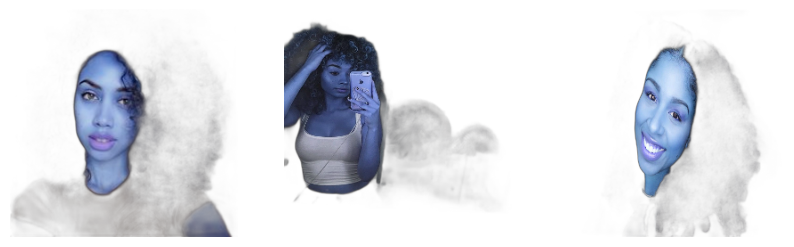

In [15]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from rembg import remove  # Background removal

# Paths
hair_texture_dataset = "C:/Users/vaibh/Downloads/HairTextures"
processed_hair_texture = "C:/Users/vaibh/Downloads/HairTextures_Processed"

# Create directories for processed images
os.makedirs(processed_hair_texture, exist_ok=True)

# Image processing settings
TARGET_SIZE = (256, 256)  # Resize all images to 256x256

def process_hair_image(image_path, save_path, remove_bg=True):
    """Loads, processes, and saves hair texture image."""
    try:
        # Read image
        image = cv2.imread(image_path)
        
        if image is None:
            print(f"Error: Could not read {image_path}")
            return None

        # Resize image
        image_resized = cv2.resize(image, TARGET_SIZE)

        # Background Removal
        if remove_bg:
            image_resized = remove(image_resized)  # Remove background

        # Normalize image
        image_normalized = image_resized / 255.0  # Scale to [0,1]

        # Save processed image
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        cv2.imwrite(save_path, (image_normalized * 255).astype(np.uint8))

        return image_normalized

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

def process_hair_dataset(input_path, output_path):
    """Applies processing to all hair texture images."""
    sample_images = []

    # Get class folders
    for category in os.listdir(input_path):
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        if not os.path.isdir(category_path):
            continue  # Skip non-folder files

        os.makedirs(output_category_path, exist_ok=True)
        images = [f for f in os.listdir(category_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        print(f"\nProcessing Category: {category} ({len(images)} images)")
        
        for img_name in tqdm(images, desc=f"Processing {category}"):
            img_path = os.path.join(category_path, img_name)
            save_img_path = os.path.join(output_category_path, img_name)

            result = process_hair_image(img_path, save_img_path)
            if result is not None and len(sample_images) < 3:
                sample_images.append(result)

    return sample_images

# Run processing
processed_samples = process_hair_dataset(hair_texture_dataset, processed_hair_texture)

# Visualize some processed images
if processed_samples:
    fig, ax = plt.subplots(1, len(processed_samples), figsize=(10, 5))
    for i, img in enumerate(processed_samples):
        ax[i].imshow(img, )
        ax[i].axis("off")
    plt.show()
else:
    print("No processed images found for visualization.")


In [12]:
# Visualize some processed images
if processed_samples:
    fig, ax = plt.subplots(1, len(processed_samples), figsize=(10, 5))
    for i, img in enumerate(processed_samples):
        ax[i].imshow(img, cmap = plt.cm.Spectral)
        ax[i].axis("off")
    plt.show()
else:
    print("No processed images found for visualization.")

NameError: name 'processed_samples' is not defined

In [13]:
pip install albumentations

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [24]:
import os
import cv2
import numpy as np
import albumentations as A
import random
import matplotlib.pyplot as plt
from tqdm import tqdm

# Paths
face_shape_path = "C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape"
hair_texture_path = "C:/Users/vaibh/Downloads/HairTextures_Processed"
augmented_face_path = "C:/Users/vaibh/Downloads/FACESHAPE/Augmented_Aligned_FaceShape"
augmented_hair_path = "C:/Users/vaibh/Downloads/HairTextures_Augmented"

# Ensure output directories exist
os.makedirs(augmented_face_path, exist_ok=True)
os.makedirs(augmented_hair_path, exist_ok=True)

# Augmentation Pipelines
face_augmentations = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.GaussianBlur(p=0.3),
    A.ColorJitter(p=0.3),
])

hair_augmentations = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.GaussianBlur(p=0.3),
    A.ElasticTransform(p=0.3, alpha=1, sigma=50),  # Fixed warning issue
])

def augment_images(input_path, output_path, augmentations, num_augmentations=3, is_face_shape=False):
    """Applies augmentation and saves augmented images."""
    for category in os.listdir(input_path):
        input_category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)
        os.makedirs(output_category_path, exist_ok=True)

        if is_face_shape:  
            # ✅ Face Shape: Traverse subfolders (training_set/Square)
            for subcategory in os.listdir(input_category_path):
                input_subcategory_path = os.path.join(input_category_path, subcategory)
                output_subcategory_path = os.path.join(output_category_path, subcategory)
                os.makedirs(output_subcategory_path, exist_ok=True)

                images = [f for f in os.listdir(input_subcategory_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                process_and_save(images, input_subcategory_path, output_subcategory_path, augmentations, num_augmentations)
        else:
            # ✅ Hair Texture: Images are directly inside category folder
            images = [f for f in os.listdir(input_category_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            process_and_save(images, input_category_path, output_category_path, augmentations, num_augmentations)

def process_and_save(images, input_path, output_path, augmentations, num_augmentations):
    """Process and save augmented images."""
    if len(images) == 0:
        print(f"Warning: No images found in {input_path}. Skipping.")
        return
    
    print(f"\nProcessing: {input_path} ({len(images)} images)")
    
    for img_name in tqdm(images, desc=f"Augmenting {os.path.basename(input_path)}"):
        img_path = os.path.join(input_path, img_name)
        image = cv2.imread(img_path)

        if image is None:
            print(f"Error loading image {img_path}")
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for i in range(num_augmentations):
            augmented = augmentations(image=image)['image']
            aug_img_name = f"{os.path.splitext(img_name)[0]}_aug{i}.jpg"
            save_path = os.path.join(output_path, aug_img_name)
            cv2.imwrite(save_path, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))

# Apply augmentation
augment_images(face_shape_path, augmented_face_path, face_augmentations, is_face_shape=True)
augment_images(hair_texture_path, augmented_hair_path, hair_augmentations, is_face_shape=False)

print("✅ Augmentation Completed!")



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\testing_set\Heart (183 images)


Augmenting Heart: 100%|██████████| 183/183 [00:01<00:00, 94.73it/s] 



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\testing_set\Oblong (193 images)


Augmenting Oblong: 100%|██████████| 193/193 [00:01<00:00, 107.96it/s]



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\testing_set\Oval (185 images)


Augmenting Oval: 100%|██████████| 185/185 [00:01<00:00, 97.41it/s] 



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\testing_set\Round (170 images)


Augmenting Round: 100%|██████████| 170/170 [00:01<00:00, 88.37it/s]



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\testing_set\Square (187 images)


Augmenting Square: 100%|██████████| 187/187 [00:02<00:00, 86.89it/s] 



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\training_set\Heart (744 images)


Augmenting Heart: 100%|██████████| 744/744 [00:07<00:00, 101.82it/s]



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\training_set\Oblong (779 images)


Augmenting Oblong: 100%|██████████| 779/779 [00:06<00:00, 113.78it/s]



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\training_set\Oval (752 images)


Augmenting Oval: 100%|██████████| 752/752 [00:07<00:00, 101.25it/s]



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\training_set\Round (686 images)


Augmenting Round: 100%|██████████| 686/686 [00:06<00:00, 98.72it/s] 



Processing: C:/Users/vaibh/Downloads/FACESHAPE/Aligned_FaceShape\training_set\Square (760 images)


Augmenting Square: 100%|██████████| 760/760 [00:08<00:00, 94.85it/s] 



Processing: C:/Users/vaibh/Downloads/HairTextures_Processed\Curly Hair (338 images)


Augmenting Curly Hair: 100%|██████████| 338/338 [00:03<00:00, 96.77it/s] 



Processing: C:/Users/vaibh/Downloads/HairTextures_Processed\Straight Hair (323 images)


Augmenting Straight Hair: 100%|██████████| 323/323 [00:03<00:00, 96.34it/s] 



Processing: C:/Users/vaibh/Downloads/HairTextures_Processed\Wavy Hair (331 images)


Augmenting Wavy Hair: 100%|██████████| 331/331 [00:03<00:00, 92.04it/s] 


✅ Augmentation Completed!


In [27]:
import os
import shutil
import random
from tqdm import tqdm

# Paths for Augmented Datasets
augmented_face_path = "C:/Users/vaibh/Downloads/FACESHAPE/Augmented_Aligned_FaceShape"
augmented_hair_path = "C:/Users/vaibh/Downloads/HairTextures_Augmented"

# Paths for Split Data
split_face_path = "C:/Users/vaibh/Downloads/FACESHAPE/Split_Aligned_FaceShape"
split_hair_path = "C:/Users/vaibh/Downloads/HairTextures_Split"

# Ensure directories exist
for path in [split_face_path, split_hair_path]:
    for split in ["train", "val", "test"]:
        os.makedirs(os.path.join(path, split), exist_ok=True)

def get_all_images(base_path, has_subfolders=True):
    """Gets all images from subdirectories.
    - has_subfolders=True -> Expects structure like `training_set/Heart/`
    - has_subfolders=False -> Directly inside `Curly Hair/`
    """
    images_dict = {}  # {category: [image paths]}
    
    if has_subfolders:
        # Handle Face Shape Dataset (training_set/testing_set subfolders)
        for main_folder in os.listdir(base_path):  # training_set, testing_set
            main_folder_path = os.path.join(base_path, main_folder)
            
            if not os.path.isdir(main_folder_path):
                continue
            
            for category in os.listdir(main_folder_path):  # Face shape categories
                category_path = os.path.join(main_folder_path, category)
                
                if not os.path.isdir(category_path):
                    continue
                
                if category not in images_dict:
                    images_dict[category] = []
                
                # Get all images in the category
                images = [os.path.join(category_path, f) for f in os.listdir(category_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                images_dict[category].extend(images)
    
    else:
        # Handle Hair Texture Dataset (no extra subfolders, categories directly inside)
        for category in os.listdir(base_path):  # Curly Hair, Wavy Hair, Straight Hair
            category_path = os.path.join(base_path, category)
            
            if not os.path.isdir(category_path):
                continue
            
            if category not in images_dict:
                images_dict[category] = []
            
            images = [os.path.join(category_path, f) for f in os.listdir(category_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            images_dict[category].extend(images)
    
    return images_dict

def split_and_save(images_dict, output_path, train_ratio=0.8, val_ratio=0.1):
    """Splits images into train, val, and test, and saves them in proper folders."""
    
    for category, images in images_dict.items():
        random.shuffle(images)

        # Calculate split sizes
        total_images = len(images)
        train_size = int(total_images * train_ratio)
        val_size = int(total_images * val_ratio)
        test_size = total_images - train_size - val_size  # Remaining for test

        train_images = images[:train_size]
        val_images = images[train_size:train_size + val_size]
        test_images = images[train_size + val_size:]

        # Create category folders inside train, val, test
        for split in ["train", "val", "test"]:
            os.makedirs(os.path.join(output_path, split, category), exist_ok=True)

        # Copy images
        for img_list, split in zip([train_images, val_images, test_images], ["train", "val", "test"]):
            for img_path in tqdm(img_list, desc=f"Splitting {category} -> {split}"):
                filename = os.path.basename(img_path)
                dst = os.path.join(output_path, split, category, filename)
                shutil.copy2(img_path, dst)  # Copy image

        print(f"✅ {category}: {train_size} train, {val_size} val, {test_size} test")

# Fetch images
print("\n📂 Fetching Augmented Face Shape Dataset images...")
face_shape_images = get_all_images(augmented_face_path, has_subfolders=True)

print("\n📂 Fetching Augmented Hair Texture Dataset images...")
hair_texture_images = get_all_images(augmented_hair_path, has_subfolders=False)

# Apply splitting
print("\n📂 Splitting Face Shape Dataset...")
split_and_save(face_shape_images, split_face_path)

print("\n📂 Splitting Hair Texture Dataset...")
split_and_save(hair_texture_images, split_hair_path)

print("\n✅ Dataset Splitting Completed!")

# Count total images in each set
def count_images(directory):
    """Counts total images in train, val, test splits."""
    total_counts = {"train": 0, "val": 0, "test": 0}
    for split in total_counts.keys():
        split_path = os.path.join(directory, split)
        if os.path.exists(split_path):
            total_counts[split] = sum(len(files) for _, _, files in os.walk(split_path))
    return total_counts

# Count images
face_counts = count_images(split_face_path)
hair_counts = count_images(split_hair_path)

print("\n📊 Total Images After Splitting:")
print(f"🔹 Face Shape Dataset: {face_counts}")
print(f"🔹 Hair Texture Dataset: {hair_counts}")



📂 Fetching Augmented Face Shape Dataset images...

📂 Fetching Augmented Hair Texture Dataset images...

📂 Splitting Face Shape Dataset...


Splitting Heart -> test: 100%|██████████| 279/279 [00:00<00:00, 780.40it/s]


✅ Heart: 2224 train, 278 val, 279 test


Splitting Oblong -> test: 100%|██████████| 293/293 [00:00<00:00, 700.76it/s]


✅ Oblong: 2332 train, 291 val, 293 test


Splitting Oval -> test: 100%|██████████| 282/282 [00:00<00:00, 781.24it/s]


✅ Oval: 2248 train, 281 val, 282 test


Splitting Round -> test: 100%|██████████| 258/258 [00:00<00:00, 838.26it/s]


✅ Round: 2054 train, 256 val, 258 test


Splitting Square -> test: 100%|██████████| 285/285 [00:00<00:00, 1020.03it/s]


✅ Square: 2272 train, 284 val, 285 test

📂 Splitting Hair Texture Dataset...


Splitting Curly Hair -> test: 100%|██████████| 102/102 [00:00<00:00, 880.28it/s]


✅ Curly Hair: 811 train, 101 val, 102 test


Splitting Straight Hair -> test: 100%|██████████| 98/98 [00:00<00:00, 907.04it/s]


✅ Straight Hair: 772 train, 96 val, 98 test


Splitting Wavy Hair -> test: 100%|██████████| 100/100 [00:00<00:00, 871.82it/s]

✅ Wavy Hair: 794 train, 99 val, 100 test

✅ Dataset Splitting Completed!

📊 Total Images After Splitting:
🔹 Face Shape Dataset: {'train': 11130, 'val': 1390, 'test': 1397}
🔹 Hair Texture Dataset: {'train': 2377, 'val': 296, 'test': 300}


In [29]:
pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/376.0 MB ? eta -:--:--
   ---------------------------------------- 2.9/376.0 MB 15.2 MB/s eta 0:00:25
   ---------------------------------------- 4.5/376.0 MB 11.2 MB/s eta 0:00:34
    --------------------------------------- 5.5/376.0 MB 8.6 MB/s eta 0:00:44
    --------------------------------------- 6.8/376.0 MB 7.9 MB/s eta 0:00:47
    --------------------------------------- 7.6/376.0 MB 7.3 MB/s eta 0:00:51
    --------------------------------------- 8.1/376.0 MB 6.8 MB/s eta 0:00:55
    --------------------------------------- 8.9/376.0 MB 5.9 MB/s eta 0:01:03
   - -------------------------------------- 9.4/376.0 MB 5.5 MB/s eta 0:01:07
   - -------------------------------------- 9.4/376.0 MB 5.5 MB/s eta 0:01:07
   - -------------------------------------- 9.7/376.0 MB 4.8 MB/s eta 0:01:16
   - -------------------------------------- 10.0/376.0 MB 4.3 MB/s eta 0:0

In [ ]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

# Path to dataset
base_dir = r"C:\Users\vaibh\Downloads\FACESHAPE\Split_Aligned_FaceShape"

# Image dimensions
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Data Augmentation (minimal since dataset is already augmented)
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load datasets
train_generator = train_datagen.flow_from_directory(
    os.path.join(base_dir, "train"),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    os.path.join(base_dir, "val"),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    os.path.join(base_dir, "test"),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

# Class labels
class_indices = train_generator.class_indices
print("Class Indices:", class_indices)

# Load VGG16 model (without top layers)
base_model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
x = Flatten()(base_model.output)
x = Dense(512, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.3)(x)
x = Dense(len(class_indices), activation="softmax")(x)

# Final model
model = Model(inputs=base_model.input, outputs=x)

# Freeze base model layers (only train new layers first)
for layer in base_model.layers:
    layer.trainable = False

# Compile model
model.compile(
    optimizer=Adam(learning_rate=3e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.TopKCategoricalAccuracy(k=2, name="top_2_accuracy")]
)

# Callbacks
checkpoint = ModelCheckpoint(
    "best_model_finetuned.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# Train model
EPOCHS = 40
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=[checkpoint, reduce_lr],
    verbose=1
)

# Save class labels for later use
import json
with open("class_indices.json", "w") as f:
    json.dump(class_indices, f)

# Evaluate on test set
test_loss, test_acc, test_top2 = model.evaluate(test_generator)
print(f"\nTest Accuracy: {test_acc:.4f}, Test Top-2 Accuracy: {test_top2:.4f}")


Found 11130 images belonging to 5 classes.
Found 1390 images belonging to 5 classes.
Found 1397 images belonging to 5 classes.
Class Indices: {'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step


C:\Users\vaibh\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2540 - loss: 1.6536 - top_2_accuracy: 0.4706
Epoch 1: val_loss improved from inf to 1.43544, saving model to best_model_finetuned.keras
348/348 ━━━━━━━━━━━━━━━━━━━━ 931s 3s/step - accuracy: 0.2541 - loss: 1.6534 - top_2_accuracy: 0.4707 - val_accuracy: 0.4065 - val_loss: 1.4354 - val_top_2_accuracy: 0.6748 - learning_rate: 3.0000e-05
Epoch 2/40
348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3751 - loss: 1.4536 - top_2_accuracy: 0.6053
Epoch 2: val_loss improved from 1.43544 to 1.34236, saving model to best_model_finetuned.keras
348/348 ━━━━━━━━━━━━━━━━━━━━ 727s 2s/step - accuracy: 0.3751 - loss: 1.4535 - top_2_accuracy: 0.6054 - val_accuracy: 0.4424 - val_loss: 1.3424 - val_top_2_accuracy: 0.6856 - learning_rate: 3.0000e-05
Epoch 3/40
348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4338 - loss: 1.3603 - top_2_accuracy: 0.6775
Epoch 3: val_loss improved from 1.34236 to 1.23491, saving model to best_model_finet

In [37]:
import os
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

# Path to dataset
base_dir = r"C:\Users\vaibh\Downloads\FACESHAPE\Split_Aligned_FaceShape"

# Image dimensions
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Data Augmentation (minimal since dataset is already augmented)
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# Load datasets
train_generator = train_datagen.flow_from_directory(
    os.path.join(base_dir, "train"),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    os.path.join(base_dir, "val"),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

# Load the last saved model
model_path = "best_model_finetuned.keras"
model = load_model(model_path)

# Callbacks
checkpoint = ModelCheckpoint(
    "best_model_finetuned.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# Continue training from epoch 19
EPOCHS = 40  # Total epochs
initial_epoch = 19  # Start from epoch 19

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    initial_epoch=initial_epoch,  # Resume from epoch 19
    callbacks=[checkpoint, reduce_lr],
    verbose=1
)


Found 11130 images belonging to 5 classes.
Found 1390 images belonging to 5 classes.
Epoch 20/40
348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8508 - loss: 0.4426 - top_2_accuracy: 0.9559
Epoch 20: val_loss improved from inf to 0.75545, saving model to best_model_finetuned.keras
348/348 ━━━━━━━━━━━━━━━━━━━━ 727s 2s/step - accuracy: 0.8509 - loss: 0.4425 - top_2_accuracy: 0.9560 - val_accuracy: 0.7101 - val_loss: 0.7554 - val_top_2_accuracy: 0.8914 - learning_rate: 3.0000e-05
Epoch 21/40
348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8648 - loss: 0.4046 - top_2_accuracy: 0.9667
Epoch 21: val_loss improved from 0.75545 to 0.72448, saving model to best_model_finetuned.keras
348/348 ━━━━━━━━━━━━━━━━━━━━ 720s 2s/step - accuracy: 0.8648 - loss: 0.4046 - top_2_accuracy: 0.9667 - val_accuracy: 0.7180 - val_loss: 0.7245 - val_top_2_accuracy: 0.9058 - learning_rate: 3.0000e-05
Epoch 22/40
348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8805 - loss: 0.3654 - top_2_accuracy: 0

KeyboardInterrupt: 

In [14]:
import os
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
# Path to dataset
base_dir = r"C:\Users\vaibh\Downloads\FACESHAPE\Split_Aligned_FaceShape"

# Image dimensions
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

In [15]:
# Load test data
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    os.path.join(base_dir, "test"),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

# Load the best saved model
model = load_model("best_model_finetuned.keras")

# Evaluate model
test_loss, test_acc, test_top2 = model.evaluate(test_generator)
print(f"\nTest Accuracy: {test_acc:.4f}, Test Top-2 Accuracy: {test_top2:.4f}")


Found 1397 images belonging to 5 classes.


C:\Users\vaibh\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


44/44 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.7654 - loss: 0.6925 - top_2_accuracy: 0.8958

Test Accuracy: 0.7566, Test Top-2 Accuracy: 0.8883


In [42]:
pip install mediapipe 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/51.0 MB ? eta -:--:--
   --- ------------------------------------ 4.5/51.0 MB 24.5 MB/s eta 0:00:02
   ------- -------------------------------- 9.4/51.0 MB 24.5 MB/s eta 0:00:02
   ----------- ---------------------------- 14.2/51.0 MB 23.4 MB/s eta 0:00:02
   --------------- ------------------------ 19.9/51.0 MB 24.7 MB/s eta 0:00:02
   ------------------- -------------------- 25.4/51.0 MB 24.8 MB/s eta 0:00:02
   ------------------------ --------------- 30.7/51.0 MB 25.0 MB/s eta 0:00:01
   --------------------------- ------------ 35.1/51.0 MB 24.3 MB/s eta 0:00:01
   ------------------------------- -------- 40.6/51.0 MB 24.4 MB/s eta 0:00:01
   ------------------------------------ --- 46.9/51.0 MB 25.1 MB/s eta 0:00:01
   ---------------------------------------- 51.0/51.0 MB 25.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.4 MB ? eta -:--:--


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


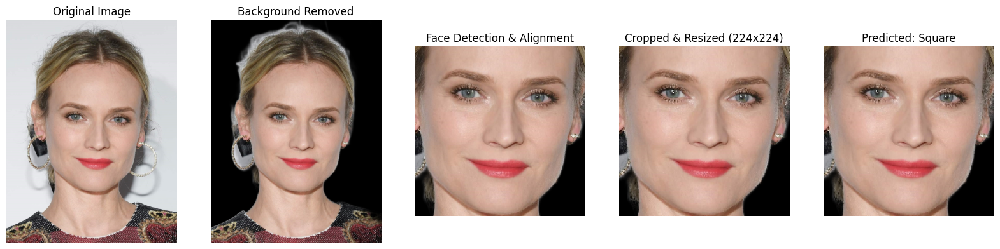

In [16]:
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove

# Load trained model
model = tf.keras.models.load_model("best_model_finetuned.keras")

# Class labels (update if different)
class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]

# Path to the test image
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\squaress.jpg"

# Load and display the original image
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Step 1: Background Removal (Fix included)
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)  # Remove background
    no_bg = np.array(no_bg)

    # Convert RGBA (4 channels) to RGB (3 channels)
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)

    return no_bg

bg_removed_img = remove_background(original_img)

# Step 2: Face Detection and Alignment using MediaPipe
mp_face_detection = mp.solutions.face_detection

def detect_and_align_face(image):
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        
        if not results.detections:
            print("No face detected!")
            return image  # Return original if no face detected
        
        # Get bounding box of detected face
        for detection in results.detections:
            bboxC = detection.location_data.relative_bounding_box
            h, w, c = image.shape
            x, y, width, height = (int(bboxC.xmin * w), int(bboxC.ymin * h), 
                                   int(bboxC.width * w), int(bboxC.height * h))
            face_crop = image[y:y+height, x:x+width]
            
            return face_crop  # Return cropped face

aligned_face_img = detect_and_align_face(bg_removed_img)

# Step 3: Crop & Resize to Match Model Input Size
target_size = (224, 224)  # Update if your model has a different input shape

def preprocess_image(image):
    image = cv2.resize(image, target_size)
    image = image.astype("float32") / 255.0  # Normalize to [0,1]
    return image

processed_img = preprocess_image(aligned_face_img)

# Step 4: Model Prediction
def predict_face_shape(model, image):
    img_array = np.expand_dims(image, axis=0)  # Add batch dimension
    predictions = model.predict(img_array)
    predicted_class = class_labels[np.argmax(predictions)]
    return predicted_class

predicted_shape = predict_face_shape(model, processed_img)

# Step 5: Plot all the images
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
axes[0].imshow(original_img)
axes[0].set_title("Original Image")
axes[1].imshow(bg_removed_img)
axes[1].set_title("Background Removed")
axes[2].imshow(aligned_face_img)
axes[2].set_title("Face Detection & Alignment")
axes[3].imshow(processed_img)
axes[3].set_title("Cropped & Resized (224x224)")
axes[4].imshow(processed_img)
axes[4].set_title(f"Predicted: {predicted_shape}")

for ax in axes:
    ax.axis("off")

plt.show()


In [17]:
pip show jax

Name: jax
Version: 0.5.3
Summary: Differentiate, compile, and transform Numpy code.
Home-page: https://github.com/jax-ml/jax
Author: JAX team
Author-email: jax-dev@google.com
License: Apache-2.0
Location: C:\Users\vaibh\anaconda3\Lib\site-packages
Requires: jaxlib, ml_dtypes, numpy, opt_einsum, scipy
Required-by: mediapipe
Note: you may need to restart the kernel to use updated packages.


In [17]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

In [18]:
# Dataset directory
dataset_path = r"C:\Users\vaibh\Downloads\HairTextures_Split"

# Subdirectories
train_dir = os.path.join(dataset_path, "train")
val_dir = os.path.join(dataset_path, "val")
test_dir = os.path.join(dataset_path, "test")

# Image size and batch size
IMG_SIZE = (224, 224)
BATCH_SIZE = 32


In [59]:
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    train_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE, class_mode='categorical')

val_data = val_datagen.flow_from_directory(
    val_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE, class_mode='categorical')

test_data = test_datagen.flow_from_directory(
    test_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=False)

# Class labels
class_labels = list(train_data.class_indices.keys())
print("Class Labels:", class_labels)


Found 2377 images belonging to 3 classes.
Found 296 images belonging to 3 classes.
Found 300 images belonging to 3 classes.
Class Labels: ['Curly Hair', 'Straight Hair', 'Wavy Hair']


In [60]:
def build_model():
    model = keras.Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(224, 224, 3)),
        BatchNormalization(),
        MaxPooling2D(2, 2),

        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        Dropout(0.2),

        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        Dropout(0.3),

        Flatten(),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(0.4),
        
        Dense(3, activation='softmax')  # 3 classes (Wavy, Curly, Straight)
    ])
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=2, name="top_2_accuracy")])
    
    return model

# Build model
model = build_model()
model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │    12,845,184 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,940,227 (49.36 MB)

 Trainable params: 12,939,523 (49.36 MB)

 Non-trainable params: 704 (2.75 KB)

In [61]:
# Save the best model based on validation loss improvement
checkpoint_callback = ModelCheckpoint("best_hair_texture_model.keras", monitor='val_loss', save_best_only=True, verbose=1)

# Reduce learning rate if no improvement
reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)

callbacks = [checkpoint_callback, reduce_lr_callback]


In [62]:
EPOCHS = 40

history = model.fit(
    train_data,
    epochs=EPOCHS,
    validation_data=val_data,
    callbacks=callbacks
)


Epoch 1/40
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - accuracy: 0.4624 - loss: 1.5436 - top_2_accuracy: 0.7873
Epoch 1: val_loss improved from inf to 2.18432, saving model to best_hair_texture_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 72s 926ms/step - accuracy: 0.4630 - loss: 1.5407 - top_2_accuracy: 0.7876 - val_accuracy: 0.3412 - val_loss: 2.1843 - val_top_2_accuracy: 0.6757 - learning_rate: 1.0000e-04
Epoch 2/40
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 857ms/step - accuracy: 0.6436 - loss: 0.8969 - top_2_accuracy: 0.8852
Epoch 2: val_loss did not improve from 2.18432
75/75 ━━━━━━━━━━━━━━━━━━━━ 66s 874ms/step - accuracy: 0.6435 - loss: 0.8967 - top_2_accuracy: 0.8852 - val_accuracy: 0.3784 - val_loss: 2.6233 - val_top_2_accuracy: 0.6757 - learning_rate: 1.0000e-04
Epoch 3/40
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 833ms/step - accuracy: 0.7138 - loss: 0.6919 - top_2_accuracy: 0.9337
Epoch 3: val_loss did not improve from 2.18432
75/75 ━━━━━━━━━━━━━━━━━━━━ 64s 850ms/step - accuracy: 0.7138 - loss: 0.6920 - t

KeyboardInterrupt: 

In [ ]:
plt.figure(figsize=(12, 5))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Training vs Validation Accuracy")

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training vs Validation Loss")

plt.show()

In [19]:
# Load best model
best_model = keras.models.load_model("best_hair_texture_model.keras")

# Evaluate on test set
test_loss, test_acc, test_top2_acc = best_model.evaluate(test_data)
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Top-2 Accuracy: {test_top2_acc:.4f}")

# Predictions
y_true = test_data.classes
y_pred = np.argmax(best_model.predict(test_data), axis=1)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print(classification_report(y_true, y_pred, target_names=class_labels))


NameError: name 'test_data' is not defined

In [20]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# Directories
train_dir = r"C:\Users\vaibh\Downloads\HairTextures_Split\train"
val_dir = r"C:\Users\vaibh\Downloads\HairTextures_Split\val"
test_dir = r"C:\Users\vaibh\Downloads\HairTextures_Split\test"

# Image and batch settings
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# 🔥 DATA AUGMENTATION
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load datasets
train_data = train_datagen.flow_from_directory(
    train_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE, class_mode='categorical')

val_data = val_datagen.flow_from_directory(
    val_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE, class_mode='categorical')

test_data = test_datagen.flow_from_directory(
    test_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=False)

# Class labels
class_labels = list(train_data.class_indices.keys())
print("Class Labels:", class_labels)

# 🏗️ Build Model
def build_mobilenetv2():
    base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = False  # Freeze base layers

    model = keras.Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.4),
        Dense(3, activation='softmax')  # 3 classes
    ])

    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0003),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=2, name="top_2_accuracy")])
    
    return model

# Build model
model = build_mobilenetv2()
model.summary()

# Callbacks
checkpoint_callback = ModelCheckpoint("best_mobilenetv2_hair_texture.keras", monitor='val_loss', save_best_only=True, verbose=1)
reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

callbacks = [checkpoint_callback, reduce_lr_callback, early_stopping]

# Training
EPOCHS = 30
history = model.fit(
    train_data,
    epochs=EPOCHS,
    validation_data=val_data,
    callbacks=callbacks
)


Found 2377 images belonging to 3 classes.
Found 296 images belonging to 3 classes.
Found 300 images belonging to 3 classes.
Class Labels: ['Curly Hair', 'Straight Hair', 'Wavy Hair']


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

C:\Users\vaibh\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 581ms/step - accuracy: 0.4666 - loss: 1.1490 - top_2_accuracy: 0.7674
Epoch 1: val_loss improved from inf to 0.71301, saving model to best_mobilenetv2_hair_texture.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 55s 649ms/step - accuracy: 0.4675 - loss: 1.1471 - top_2_accuracy: 0.7682 - val_accuracy: 0.7095 - val_loss: 0.7130 - val_top_2_accuracy: 0.9459 - learning_rate: 3.0000e-04
Epoch 2/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 576ms/step - accuracy: 0.6527 - loss: 0.7533 - top_2_accuracy: 0.9134
Epoch 2: val_loss improved from 0.71301 to 0.61899, saving model to best_mobilenetv2_hair_texture.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 46s 616ms/step - accuracy: 0.6529 - loss: 0.7532 - top_2_accuracy: 0.9136 - val_accuracy: 0.7230 - val_loss: 0.6190 - val_top_2_accuracy: 0.9459 - learning_rate: 3.0000e-04
Epoch 3/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 604ms/step - accuracy: 0.7016 - loss: 0.6804 - top_2_accuracy: 0.9286
Epoch 3: val_loss improved from 0.61899 to 0.54687, saving mode

10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - accuracy: 0.8954 - loss: 0.2562 - top_2_accuracy: 0.9878
Test Accuracy: 0.8833
Test Top-2 Accuracy: 0.9867
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 417ms/step


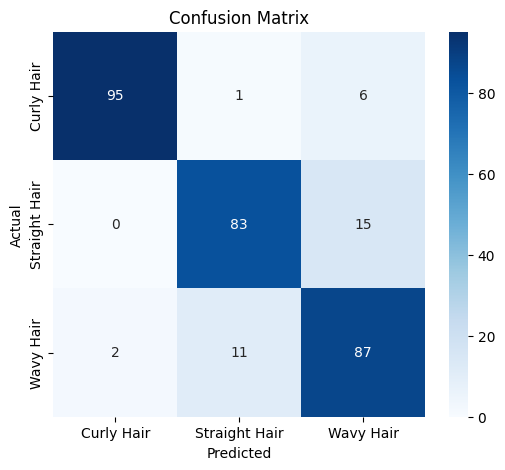


Classification Report:

               precision    recall  f1-score   support

   Curly Hair       0.98      0.93      0.95       102
Straight Hair       0.87      0.85      0.86        98
    Wavy Hair       0.81      0.87      0.84       100

     accuracy                           0.88       300
    macro avg       0.89      0.88      0.88       300
 weighted avg       0.89      0.88      0.88       300



In [21]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# 🔄 Load Best Model
model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# 🎯 Evaluate on Test Data
test_loss, test_acc, test_top2_acc = model.evaluate(test_data)
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Top-2 Accuracy: {test_top2_acc:.4f}")

# 🔍 Get Predictions
pred_probs = model.predict(test_data)  # Softmax probabilities
y_pred = np.argmax(pred_probs, axis=1)  # Convert to class indices
y_true = test_data.classes  # True labels

# 🎭 Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# 📊 Classification Report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))


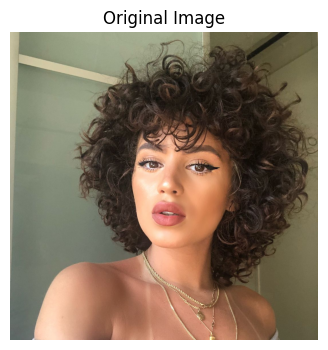

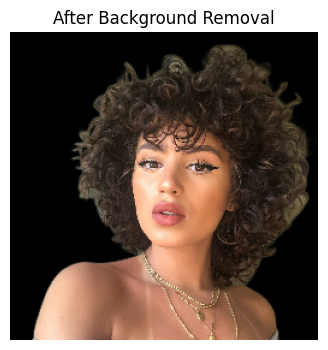

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
🔮 Prediction Probabilities:
Curly: 0.9999
Straight: 0.0000
Wavy: 0.0001

✅ Final Predicted Hair Texture: **CURLY**


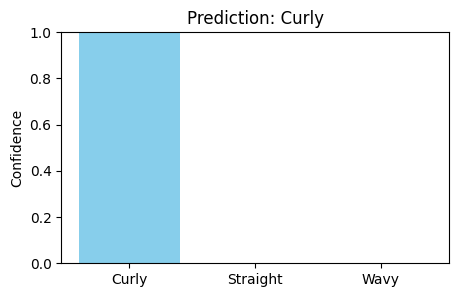

In [28]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from rembg import remove
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array

# Load model
model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")
class_labels = ['Curly', 'Straight', 'Wavy']  # Adjust based on your training

# Load image
image_path = r"C:\Users\vaibh\Downloads\HairTextures_Split\currlll.jpg"  # Change to your test image
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(4, 4))
plt.title("Original Image")
plt.imshow(original_img)
plt.axis('off')
plt.show()

# Resize to 256x256 as per your training processing
resized_img = cv2.resize(original_img, (256, 256))

# Remove background
bg_removed = remove(resized_img)

# 🔧 Fix: Convert RGBA to RGB
bg_removed = cv2.cvtColor(bg_removed, cv2.COLOR_RGBA2RGB)

plt.figure(figsize=(4, 4))
plt.title("After Background Removal")
plt.imshow(bg_removed)
plt.axis('off')
plt.show()

# Resize to 224x224 for model input
resized_for_model = cv2.resize(bg_removed, (224, 224))

# Normalize and reshape
img_array = img_to_array(resized_for_model) / 255.0
img_array = np.expand_dims(img_array, axis=0)

# Predict
pred_probs = model.predict(img_array)[0]
pred_index = np.argmax(pred_probs)
pred_label = class_labels[pred_index]

# Show prediction
print("🔮 Prediction Probabilities:")
for i, label in enumerate(class_labels):
    print(f"{label}: {pred_probs[i]:.4f}")

print(f"\n✅ Final Predicted Hair Texture: **{pred_label.upper()}**")

# Confidence bar chart
plt.figure(figsize=(5, 3))
plt.bar(class_labels, pred_probs, color='skyblue')
plt.title(f"Prediction: {pred_label}")
plt.ylabel("Confidence")
plt.ylim(0, 1)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


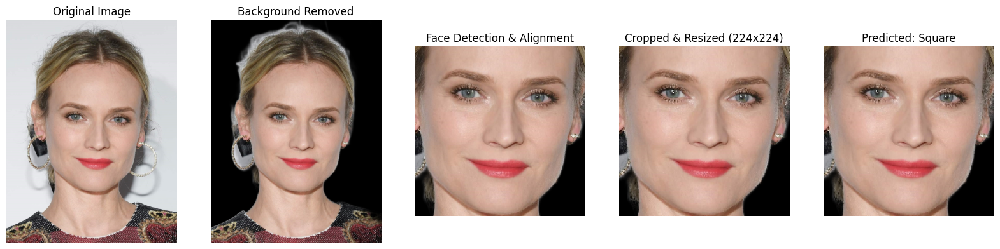

In [31]:
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove

# Load trained model
model = tf.keras.models.load_model("best_model_finetuned.keras")

# Class labels (update if different)
class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]

# Path to the test image
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\squaress.jpg"

# Load and display the original image
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Step 1: Background Removal (Fix included)
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)  # Remove background
    no_bg = np.array(no_bg)

    # Convert RGBA (4 channels) to RGB (3 channels)
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)

    return no_bg

bg_removed_img = remove_background(original_img)

# Step 2: Face Detection and Alignment using MediaPipe
mp_face_detection = mp.solutions.face_detection

def detect_and_align_face(image):
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        
        if not results.detections:
            print("No face detected!")
            return image  # Return original if no face detected
        
        # Get bounding box of detected face
        for detection in results.detections:
            bboxC = detection.location_data.relative_bounding_box
            h, w, c = image.shape
            x, y, width, height = (int(bboxC.xmin * w), int(bboxC.ymin * h), 
                                   int(bboxC.width * w), int(bboxC.height * h))
            face_crop = image[y:y+height, x:x+width]
            
            return face_crop  # Return cropped face

aligned_face_img = detect_and_align_face(bg_removed_img)

# Step 3: Crop & Resize to Match Model Input Size
target_size = (224, 224)  # Update if your model has a different input shape

def preprocess_image(image):
    image = cv2.resize(image, target_size)
    image = image.astype("float32") / 255.0  # Normalize to [0,1]
    return image

processed_img = preprocess_image(aligned_face_img)

# Step 4: Model Prediction
def predict_face_shape(model, image):
    img_array = np.expand_dims(image, axis=0)  # Add batch dimension
    predictions = model.predict(img_array)
    predicted_class = class_labels[np.argmax(predictions)]
    return predicted_class

predicted_shape = predict_face_shape(model, processed_img)

# Step 5: Plot all the images
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
axes[0].imshow(original_img)
axes[0].set_title("Original Image")
axes[1].imshow(bg_removed_img)
axes[1].set_title("Background Removed")
axes[2].imshow(aligned_face_img)
axes[2].set_title("Face Detection & Alignment")
axes[3].imshow(processed_img)
axes[3].set_title("Cropped & Resized (224x224)")
axes[4].imshow(processed_img)
axes[4].set_title(f"Predicted: {predicted_shape}")

for ax in axes:
    ax.axis("off")

plt.show()

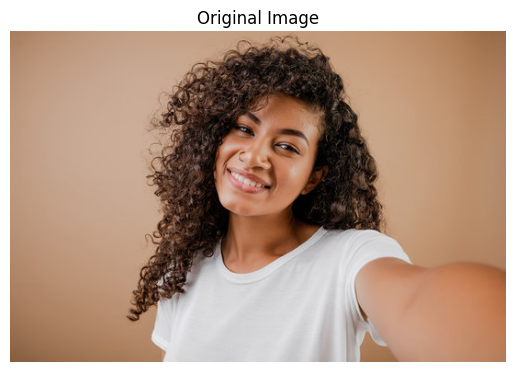

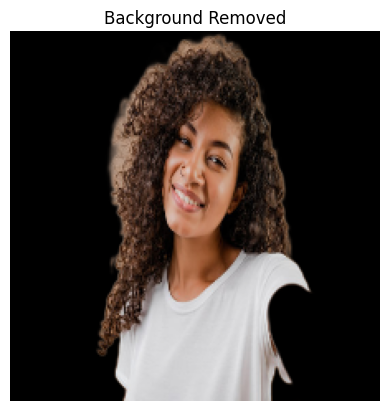

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step

🎯 Predicted Face Shape: Square
🎯 Predicted Hair Texture: Curly


In [34]:
import os
import cv2
import numpy as np
import tensorflow as tf
from rembg import remove
import matplotlib.pyplot as plt

# Paths
face_model_path = "best_model_finetuned.keras"
hair_model_path = "best_mobilenetv2_hair_texture.keras"
test_image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\testingimg.jpg"  # 🔁 Replace with your actual image name

# Load Models
face_model = tf.keras.models.load_model(face_model_path)
hair_model = tf.keras.models.load_model(hair_model_path)

# Class Labels
face_class_labels = ['Square', 'Oblong', 'Heart', 'Oval', 'Round']
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Image size
IMG_SIZE = (224, 224)

def preprocess_image(image_path):
    # Load image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Could not load image from {image_path}")
        
    # Show original
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    plt.show()

    # Resize for consistency
    image_resized = cv2.resize(image, IMG_SIZE)

    # Background removal using rembg
    image_no_bg = remove(image_resized)

    # Convert RGBA to RGB if needed
    if image_no_bg.shape[-1] == 4:
        image_no_bg = cv2.cvtColor(image_no_bg, cv2.COLOR_BGRA2BGR)

    # Show background-removed
    plt.imshow(cv2.cvtColor(image_no_bg, cv2.COLOR_BGR2RGB))
    plt.title("Background Removed")
    plt.axis("off")
    plt.show()

    # Normalize
    image_normalized = image_no_bg / 255.0
    return np.expand_dims(image_normalized, axis=0)

# Preprocess the image
img_array = preprocess_image(test_image_path)

# Predict face shape
face_pred = face_model.predict(img_array)[0]
face_label = face_class_labels[np.argmax(face_pred)]

# Predict hair texture
hair_pred = hair_model.predict(img_array)[0]
hair_label = hair_class_labels[np.argmax(hair_pred)]

# Output
print(f"\n🎯 Predicted Face Shape: {face_label}")
print(f"🎯 Predicted Hair Texture: {hair_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
🧠 Predicted Face Shape: Round
💇 Predicted Hair Texture: Straight


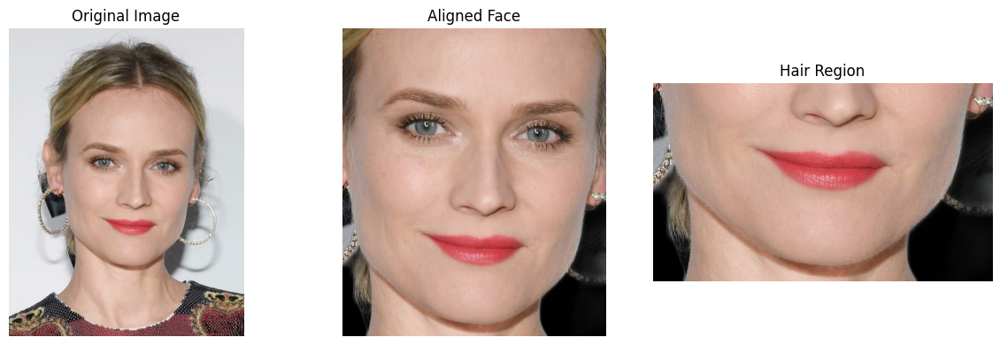

In [43]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import json
from rembg import remove
import mediapipe as mp
import os

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Define class labels
face_class_labels = ['Square', 'Oblong', 'Heart', 'Oval', 'Round']
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\squaress.jpg"

# Constants
IMG_SIZE = (224, 224)

# ===== Step 1: Load and remove background =====
original = cv2.imread(image_path)
if original is None:
    raise FileNotFoundError(f"Image not found: {image_path}")

# Remove background
bg_removed = remove(original)

# Convert to RGB
image_rgb = cv2.cvtColor(bg_removed, cv2.COLOR_BGR2RGB)

# ===== Step 2: Face alignment and cropping using MediaPipe =====
mp_face_mesh = mp.solutions.face_mesh
with mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=True) as face_mesh:
    results = face_mesh.process(image_rgb)

    if not results.multi_face_landmarks:
        raise Exception("No face detected!")

    h, w, _ = image_rgb.shape
    face_landmarks = results.multi_face_landmarks[0]

    # Get bounding box from landmarks
    x_coords = [int(landmark.x * w) for landmark in face_landmarks.landmark]
    y_coords = [int(landmark.y * h) for landmark in face_landmarks.landmark]
    x_min, x_max = max(min(x_coords) - 20, 0), min(max(x_coords) + 20, w)
    y_min, y_max = max(min(y_coords) - 20, 0), min(max(y_coords) + 20, h)

    aligned_face = image_rgb[y_min:y_max, x_min:x_max]

# Resize for face shape model
aligned_face_resized = cv2.resize(aligned_face, IMG_SIZE)
face_input = np.expand_dims(aligned_face_resized / 255.0, axis=0)

# ===== Step 3: Hair region segmentation =====
# Heuristic: Use bottom 40-50% of aligned face image as hair region
hair_region = aligned_face[int(aligned_face.shape[0] * 0.5):, :]
hair_resized = cv2.resize(hair_region, IMG_SIZE)
hair_input = np.expand_dims(hair_resized / 255.0, axis=0)

# ===== Step 4: Predict =====
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

# ===== Step 5: Display Results =====
print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

# Visualization
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(aligned_face)
plt.title("Aligned Face")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(hair_region)
plt.title("Hair Region")
plt.axis("off")
plt.tight_layout()
plt.show()

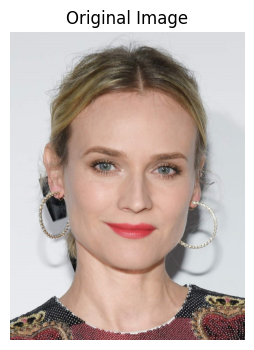

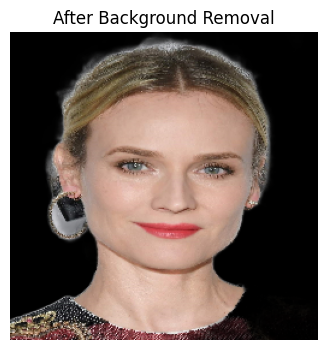

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
🔮 Prediction Probabilities:
Curly: 0.0040
Straight: 0.7841
Wavy: 0.2120

✅ Final Predicted Hair Texture: **STRAIGHT**


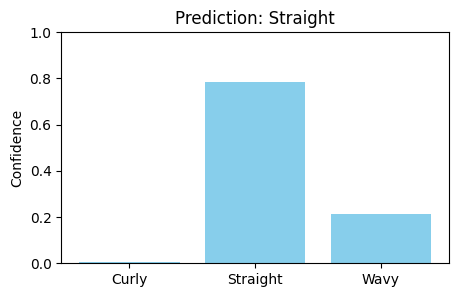

In [41]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from rembg import remove
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array

# Load model
model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")
class_labels = ['Curly', 'Straight', 'Wavy']  # Adjust based on your training

# Load image
image_path =  r"C:\Users\vaibh\Downloads\FACESHAPE\squaress.jpg"  # Change to your test image
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(4, 4))
plt.title("Original Image")
plt.imshow(original_img)
plt.axis('off')
plt.show()

# Resize to 256x256 as per your training processing
resized_img = cv2.resize(original_img, (256, 256))

# Remove background
bg_removed = remove(resized_img)

# 🔧 Fix: Convert RGBA to RGB
bg_removed = cv2.cvtColor(bg_removed, cv2.COLOR_RGBA2RGB)

plt.figure(figsize=(4, 4))
plt.title("After Background Removal")
plt.imshow(bg_removed)
plt.axis('off')
plt.show()

# Resize to 224x224 for model input
resized_for_model = cv2.resize(bg_removed, (224, 224))

# Normalize and reshape
img_array = img_to_array(resized_for_model) / 255.0
img_array = np.expand_dims(img_array, axis=0)

# Predict
pred_probs = model.predict(img_array)[0]
pred_index = np.argmax(pred_probs)
pred_label = class_labels[pred_index]

# Show prediction
print("🔮 Prediction Probabilities:")
for i, label in enumerate(class_labels):
    print(f"{label}: {pred_probs[i]:.4f}")

print(f"\n✅ Final Predicted Hair Texture: **{pred_label.upper()}**")

# Confidence bar chart
plt.figure(figsize=(5, 3))
plt.bar(class_labels, pred_probs, color='skyblue')
plt.title(f"Prediction: {pred_label}")
plt.ylabel("Confidence")
plt.ylim(0, 1)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
🧠 Predicted Face Shape: Round
💇 Predicted Hair Texture: Straight


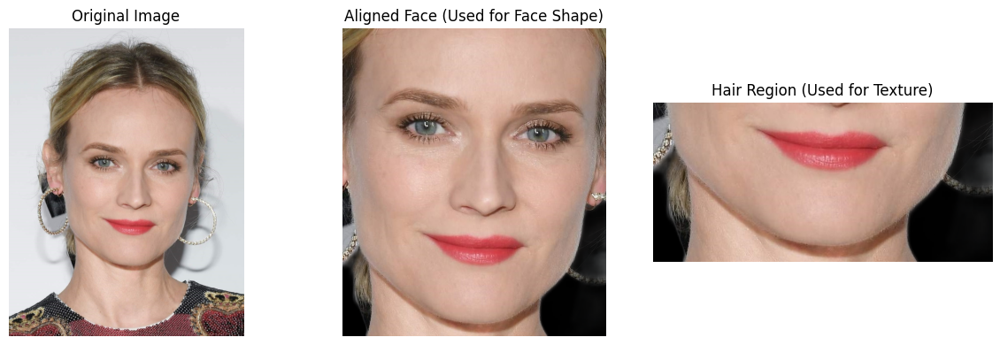

In [47]:
import os
import cv2
import numpy as np
import tensorflow as tf
from rembg import remove
import mediapipe as mp
import matplotlib.pyplot as plt

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Class labels
face_class_labels = ['Square', 'Oblong', 'Heart', 'Oval', 'Round']
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\squaress.jpg"  # ⬅️ Replace as needed

# Constants
IMG_SIZE = (224, 224)

# Step 1: Load & remove background
original = cv2.imread(image_path)
if original is None:
    raise FileNotFoundError(f"Image not found at {image_path}")

bg_removed = remove(original)
bg_removed_rgb = cv2.cvtColor(bg_removed, cv2.COLOR_BGR2RGB)

# Step 2: Face alignment & cropping
mp_face_mesh = mp.solutions.face_mesh
with mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=True) as face_mesh:
    results = face_mesh.process(bg_removed_rgb)

    if not results.multi_face_landmarks:
        raise Exception("No face detected!")

    h, w, _ = bg_removed_rgb.shape
    face_landmarks = results.multi_face_landmarks[0]

    x_coords = [int(lm.x * w) for lm in face_landmarks.landmark]
    y_coords = [int(lm.y * h) for lm in face_landmarks.landmark]
    x_min, x_max = max(min(x_coords) - 20, 0), min(max(x_coords) + 20, w)
    y_min, y_max = max(min(y_coords) - 20, 0), min(max(y_coords) + 20, h)

    aligned_face = bg_removed_rgb[y_min:y_max, x_min:x_max]

# Step 3: Prepare inputs
# Face input
aligned_face_resized = cv2.resize(aligned_face, IMG_SIZE)
face_input = np.expand_dims(aligned_face_resized / 255.0, axis=0)

# Hair input (bottom 40% of aligned face)
hair_region = aligned_face[int(aligned_face.shape[0] * 0.6):, :]
hair_resized = cv2.resize(hair_region, IMG_SIZE)
hair_input = np.expand_dims(hair_resized / 255.0, axis=0)

# Step 4: Predict
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

# Step 5: Display results
print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

# Visualization
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(aligned_face)
plt.title("Aligned Face (Used for Face Shape)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(hair_region)
plt.title("Hair Region (Used for Texture)")
plt.axis("off")

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
🧠 Predicted Face Shape: Round
💇 Predicted Hair Texture: Straight


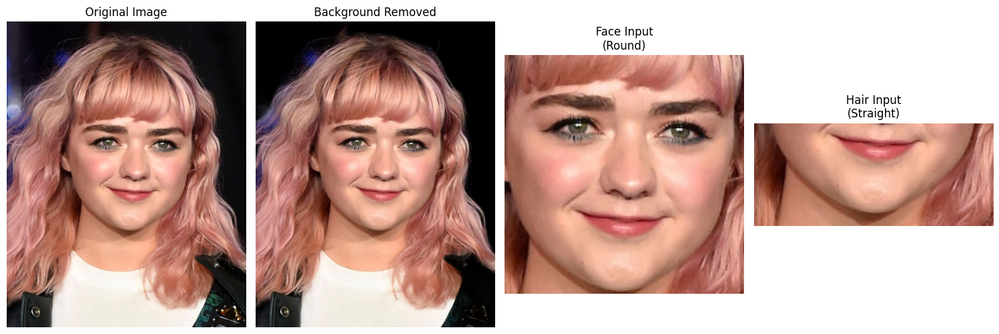

In [51]:
import os
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Class labels
face_class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Input image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\roundss.jpg"

# Constants
IMG_SIZE = (224, 224)

### 🔹 Step 1: Load & Background Removal (common for both)
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)
    no_bg = np.array(no_bg)

    # Convert RGBA to RGB if needed
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)
    return no_bg

original_img = cv2.imread(image_path)
if original_img is None:
    raise FileNotFoundError(f"Image not found: {image_path}")
original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
bg_removed_img = remove_background(original_rgb)

### 🔹 Step 2A: Face Shape - MediaPipe Face Detection (for clean aligned face)
def get_aligned_face(image):
    mp_face_detection = mp.solutions.face_detection
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        if not results.detections:
            raise Exception("No face detected!")

        bboxC = results.detections[0].location_data.relative_bounding_box
        h, w, _ = image.shape
        x = int(bboxC.xmin * w)
        y = int(bboxC.ymin * h)
        width = int(bboxC.width * w)
        height = int(bboxC.height * h)

        return image[y:y+height, x:x+width]

aligned_face = get_aligned_face(bg_removed_img)

def preprocess_image(image, size=(224, 224)):
    image = cv2.resize(image, size)
    image = image.astype("float32") / 255.0
    return np.expand_dims(image, axis=0)

face_input = preprocess_image(aligned_face)

### 🔹 Step 2B: Hair Texture - MediaPipe Face Mesh → Landmark-Based Hair Region Extraction
def get_hair_region(image):
    mp_face_mesh = mp.solutions.face_mesh
    with mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=True) as face_mesh:
        results = face_mesh.process(image)
        if not results.multi_face_landmarks:
            raise Exception("No face landmarks found!")

        h, w, _ = image.shape
        landmarks = results.multi_face_landmarks[0]

        x_coords = [int(lm.x * w) for lm in landmarks.landmark]
        y_coords = [int(lm.y * h) for lm in landmarks.landmark]

        x_min = max(min(x_coords) - 20, 0)
        x_max = min(max(x_coords) + 20, w)
        y_min = max(min(y_coords) - 20, 0)
        y_max = min(max(y_coords) + 20, h)

        aligned_face = image[y_min:y_max, x_min:x_max]
        hair = aligned_face[int(aligned_face.shape[0] * 0.6):, :]
        return hair

hair_region = get_hair_region(bg_removed_img)
hair_input = preprocess_image(hair_region)

### 🔹 Step 3: Predict
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

### 🔹 Step 4: Visualization
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(bg_removed_img)
plt.title("Background Removed")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(aligned_face)
plt.title(f"Face Input\n({face_label})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(hair_region)
plt.title(f"Hair Input\n({hair_label})")
plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
🧠 Predicted Face Shape: Oval
💇 Predicted Hair Texture: Straight


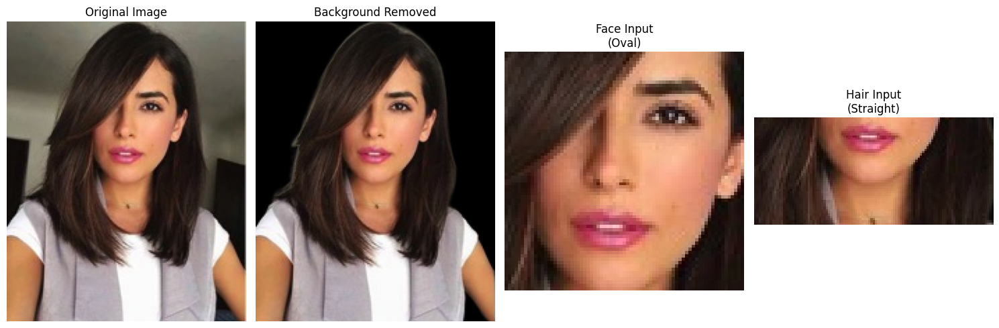

In [52]:
import os
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Class labels
face_class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Input image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\straightss.jpg"

# Constants
IMG_SIZE = (224, 224)

### 🔹 Step 1: Load & Background Removal (common for both)
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)
    no_bg = np.array(no_bg)

    # Convert RGBA to RGB if needed
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)
    return no_bg

original_img = cv2.imread(image_path)
if original_img is None:
    raise FileNotFoundError(f"Image not found: {image_path}")
original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
bg_removed_img = remove_background(original_rgb)

### 🔹 Step 2A: Face Shape - MediaPipe Face Detection (for clean aligned face)
def get_aligned_face(image):
    mp_face_detection = mp.solutions.face_detection
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        if not results.detections:
            raise Exception("No face detected!")

        bboxC = results.detections[0].location_data.relative_bounding_box
        h, w, _ = image.shape
        x = int(bboxC.xmin * w)
        y = int(bboxC.ymin * h)
        width = int(bboxC.width * w)
        height = int(bboxC.height * h)

        return image[y:y+height, x:x+width]

aligned_face = get_aligned_face(bg_removed_img)

def preprocess_image(image, size=(224, 224)):
    image = cv2.resize(image, size)
    image = image.astype("float32") / 255.0
    return np.expand_dims(image, axis=0)

face_input = preprocess_image(aligned_face)

### 🔹 Step 2B: Hair Texture - MediaPipe Face Mesh → Landmark-Based Hair Region Extraction
def get_hair_region(image):
    mp_face_mesh = mp.solutions.face_mesh
    with mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=True) as face_mesh:
        results = face_mesh.process(image)
        if not results.multi_face_landmarks:
            raise Exception("No face landmarks found!")

        h, w, _ = image.shape
        landmarks = results.multi_face_landmarks[0]

        x_coords = [int(lm.x * w) for lm in landmarks.landmark]
        y_coords = [int(lm.y * h) for lm in landmarks.landmark]

        x_min = max(min(x_coords) - 20, 0)
        x_max = min(max(x_coords) + 20, w)
        y_min = max(min(y_coords) - 20, 0)
        y_max = min(max(y_coords) + 20, h)

        aligned_face = image[y_min:y_max, x_min:x_max]
        hair = aligned_face[int(aligned_face.shape[0] * 0.6):, :]
        return hair

hair_region = get_hair_region(bg_removed_img)
hair_input = preprocess_image(hair_region)

### 🔹 Step 3: Predict
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

### 🔹 Step 4: Visualization
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(bg_removed_img)
plt.title("Background Removed")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(aligned_face)
plt.title(f"Face Input\n({face_label})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(hair_region)
plt.title(f"Hair Input\n({hair_label})")
plt.axis("off")

plt.tight_layout()
plt.show()


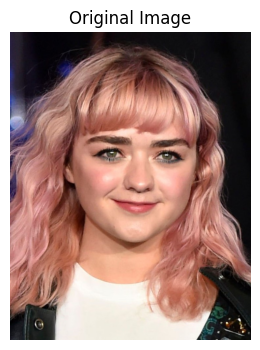

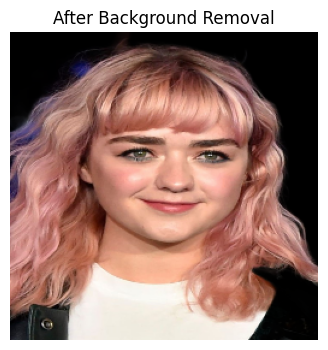

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
🔮 Prediction Probabilities:
Curly: 0.0003
Straight: 0.0128
Wavy: 0.9869

✅ Final Predicted Hair Texture: **WAVY**


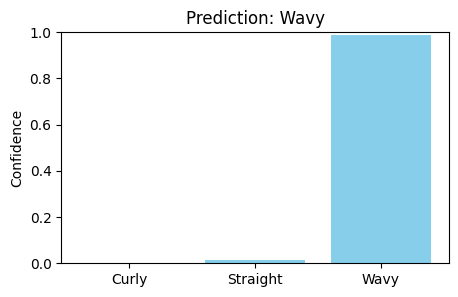

In [53]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from rembg import remove
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array

# Load model
model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")
class_labels = ['Curly', 'Straight', 'Wavy']  # Adjust based on your training

# Load image
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\roundss.jpg"  # Change to your test image
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(4, 4))
plt.title("Original Image")
plt.imshow(original_img)
plt.axis('off')
plt.show()

# Resize to 256x256 as per your training processing
resized_img = cv2.resize(original_img, (256, 256))

# Remove background
bg_removed = remove(resized_img)

# 🔧 Fix: Convert RGBA to RGB
bg_removed = cv2.cvtColor(bg_removed, cv2.COLOR_RGBA2RGB)

plt.figure(figsize=(4, 4))
plt.title("After Background Removal")
plt.imshow(bg_removed)
plt.axis('off')
plt.show()

# Resize to 224x224 for model input
resized_for_model = cv2.resize(bg_removed, (224, 224))

# Normalize and reshape
img_array = img_to_array(resized_for_model) / 255.0
img_array = np.expand_dims(img_array, axis=0)

# Predict
pred_probs = model.predict(img_array)[0]
pred_index = np.argmax(pred_probs)
pred_label = class_labels[pred_index]

# Show prediction
print("🔮 Prediction Probabilities:")
for i, label in enumerate(class_labels):
    print(f"{label}: {pred_probs[i]:.4f}")

print(f"\n✅ Final Predicted Hair Texture: **{pred_label.upper()}**")

# Confidence bar chart
plt.figure(figsize=(5, 3))
plt.bar(class_labels, pred_probs, color='skyblue')
plt.title(f"Prediction: {pred_label}")
plt.ylabel("Confidence")
plt.ylim(0, 1)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
🧠 Predicted Face Shape: Round
💇 Predicted Hair Texture: Wavy


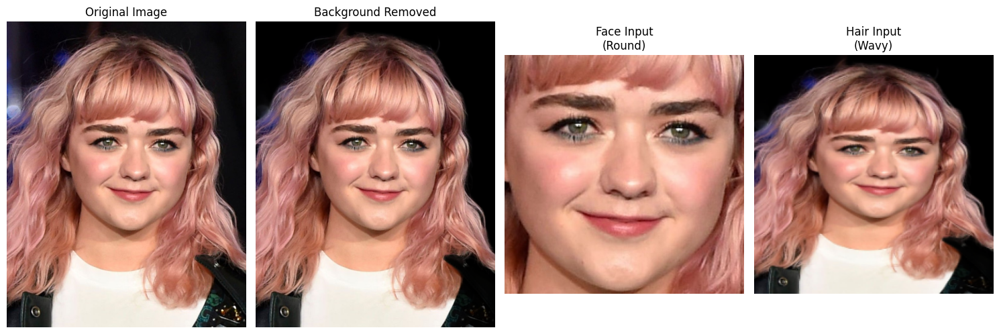

In [54]:
import os
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove
from tensorflow.keras.preprocessing.image import img_to_array

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Class labels
face_class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Input image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\roundss.jpg"
IMG_SIZE = (224, 224)

### 🔹 Step 1: Load and Remove Background
original_img = cv2.imread(image_path)
if original_img is None:
    raise FileNotFoundError(f"Image not found: {image_path}")
original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Background Removal
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)
    no_bg = np.array(no_bg)
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)
    return no_bg

bg_removed_img = remove_background(original_rgb)

### 🔹 Step 2A: Preprocess for Face Shape
def get_aligned_face(image):
    mp_face_detection = mp.solutions.face_detection
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        if not results.detections:
            raise Exception("No face detected!")

        bboxC = results.detections[0].location_data.relative_bounding_box
        h, w, _ = image.shape
        x = int(bboxC.xmin * w)
        y = int(bboxC.ymin * h)
        width = int(bboxC.width * w)
        height = int(bboxC.height * h)

        return image[y:y+height, x:x+width]

aligned_face = get_aligned_face(bg_removed_img)

# Resize and normalize
def preprocess_image(image, size=(224, 224)):
    image = cv2.resize(image, size)
    image = image.astype("float32") / 255.0
    return np.expand_dims(image, axis=0)

face_input = preprocess_image(aligned_face)

### 🔹 Step 2B: Preprocess for Hair Texture — Match Original Working Flow
# Don't crop using face mesh — use entire image after background removal
# Resize to 256x256 → then 224x224 → then normalize

hair_img_resized = cv2.resize(bg_removed_img, (256, 256))  # Match the training input
hair_img_resized = cv2.resize(hair_img_resized, IMG_SIZE)  # Final model input size

hair_input = img_to_array(hair_img_resized) / 255.0
hair_input = np.expand_dims(hair_input, axis=0)

### 🔹 Step 3: Predict
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

### 🔹 Step 4: Visualization
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(bg_removed_img)
plt.title("Background Removed")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(aligned_face)
plt.title(f"Face Input\n({face_label})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(hair_img_resized)
plt.title(f"Hair Input\n({hair_label})")
plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
🧠 Predicted Face Shape: Oblong
💇 Predicted Hair Texture: Wavy


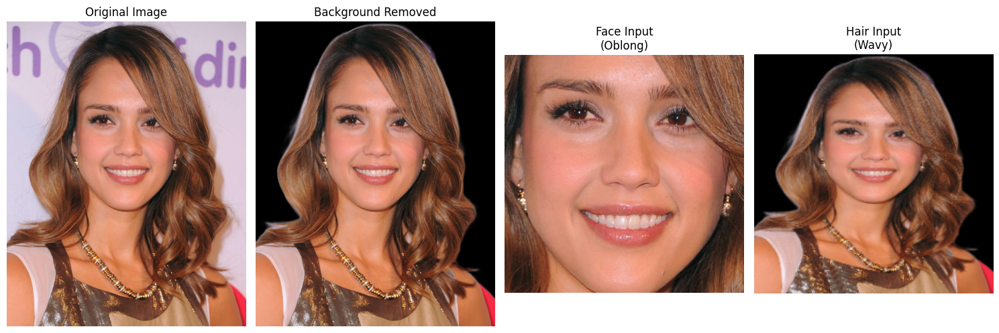

In [55]:
import os
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove
from tensorflow.keras.preprocessing.image import img_to_array

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Class labels
face_class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Input image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\testingimg.jpg"
IMG_SIZE = (224, 224)

### 🔹 Step 1: Load and Remove Background
original_img = cv2.imread(image_path)
if original_img is None:
    raise FileNotFoundError(f"Image not found: {image_path}")
original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Background Removal
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)
    no_bg = np.array(no_bg)
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)
    return no_bg

bg_removed_img = remove_background(original_rgb)

### 🔹 Step 2A: Preprocess for Face Shape
def get_aligned_face(image):
    mp_face_detection = mp.solutions.face_detection
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        if not results.detections:
            raise Exception("No face detected!")

        bboxC = results.detections[0].location_data.relative_bounding_box
        h, w, _ = image.shape
        x = int(bboxC.xmin * w)
        y = int(bboxC.ymin * h)
        width = int(bboxC.width * w)
        height = int(bboxC.height * h)

        return image[y:y+height, x:x+width]

aligned_face = get_aligned_face(bg_removed_img)

# Resize and normalize
def preprocess_image(image, size=(224, 224)):
    image = cv2.resize(image, size)
    image = image.astype("float32") / 255.0
    return np.expand_dims(image, axis=0)

face_input = preprocess_image(aligned_face)

### 🔹 Step 2B: Preprocess for Hair Texture — Match Original Working Flow
# Don't crop using face mesh — use entire image after background removal
# Resize to 256x256 → then 224x224 → then normalize

hair_img_resized = cv2.resize(bg_removed_img, (256, 256))  # Match the training input
hair_img_resized = cv2.resize(hair_img_resized, IMG_SIZE)  # Final model input size

hair_input = img_to_array(hair_img_resized) / 255.0
hair_input = np.expand_dims(hair_input, axis=0)

### 🔹 Step 3: Predict
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

### 🔹 Step 4: Visualization
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(bg_removed_img)
plt.title("Background Removed")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(aligned_face)
plt.title(f"Face Input\n({face_label})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(hair_img_resized)
plt.title(f"Hair Input\n({hair_label})")
plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
🧠 Predicted Face Shape: Round
💇 Predicted Hair Texture: Straight


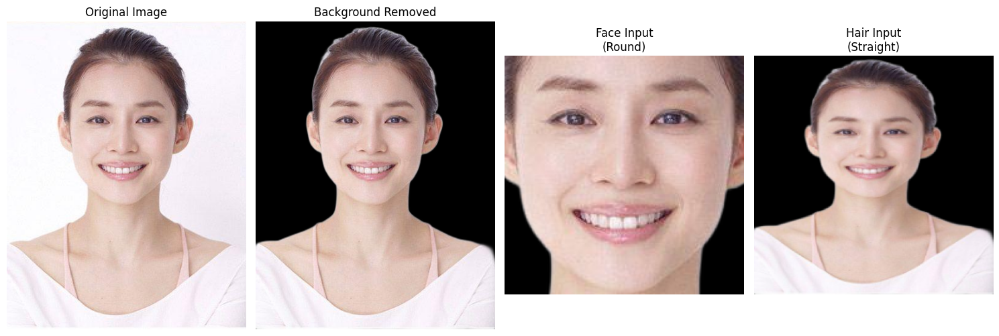

In [56]:
import os
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove
from tensorflow.keras.preprocessing.image import img_to_array

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Class labels
face_class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Input image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\ovalss.jpg"
IMG_SIZE = (224, 224)

### 🔹 Step 1: Load and Remove Background
original_img = cv2.imread(image_path)
if original_img is None:
    raise FileNotFoundError(f"Image not found: {image_path}")
original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Background Removal
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)
    no_bg = np.array(no_bg)
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)
    return no_bg

bg_removed_img = remove_background(original_rgb)

### 🔹 Step 2A: Preprocess for Face Shape
def get_aligned_face(image):
    mp_face_detection = mp.solutions.face_detection
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        if not results.detections:
            raise Exception("No face detected!")

        bboxC = results.detections[0].location_data.relative_bounding_box
        h, w, _ = image.shape
        x = int(bboxC.xmin * w)
        y = int(bboxC.ymin * h)
        width = int(bboxC.width * w)
        height = int(bboxC.height * h)

        return image[y:y+height, x:x+width]

aligned_face = get_aligned_face(bg_removed_img)

# Resize and normalize
def preprocess_image(image, size=(224, 224)):
    image = cv2.resize(image, size)
    image = image.astype("float32") / 255.0
    return np.expand_dims(image, axis=0)

face_input = preprocess_image(aligned_face)

### 🔹 Step 2B: Preprocess for Hair Texture — Match Original Working Flow
# Don't crop using face mesh — use entire image after background removal
# Resize to 256x256 → then 224x224 → then normalize

hair_img_resized = cv2.resize(bg_removed_img, (256, 256))  # Match the training input
hair_img_resized = cv2.resize(hair_img_resized, IMG_SIZE)  # Final model input size

hair_input = img_to_array(hair_img_resized) / 255.0
hair_input = np.expand_dims(hair_input, axis=0)

### 🔹 Step 3: Predict
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

### 🔹 Step 4: Visualization
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(bg_removed_img)
plt.title("Background Removed")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(aligned_face)
plt.title(f"Face Input\n({face_label})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(hair_img_resized)
plt.title(f"Hair Input\n({hair_label})")
plt.axis("off")

plt.tight_layout()
plt.show()


C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
C:\Users\vaibh\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
🧠 Predicted Face Shape: Round
💇 Predicted Hair Texture: Straight


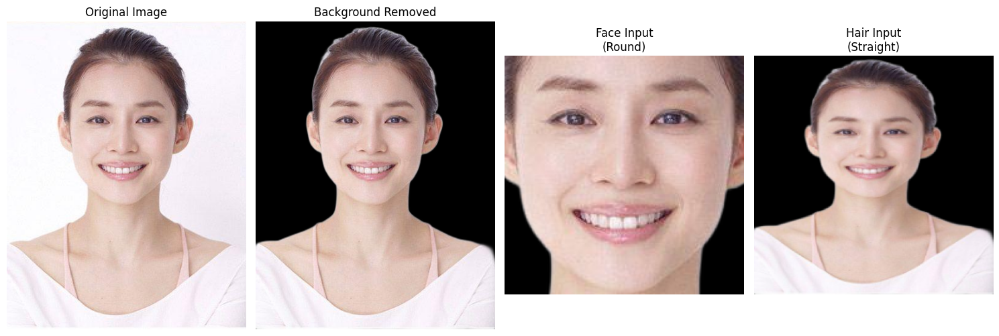

In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
import mediapipe as mp
import matplotlib.pyplot as plt
from PIL import Image
from rembg import remove
from tensorflow.keras.preprocessing.image import img_to_array

# Load models
face_model = tf.keras.models.load_model("best_model_finetuned.keras")
hair_model = tf.keras.models.load_model("best_mobilenetv2_hair_texture.keras")

# Class labels
face_class_labels = ["Heart", "Oblong", "Oval", "Round", "Square"]
hair_class_labels = ['Curly', 'Straight', 'Wavy']

# Input image path
image_path = r"C:\Users\vaibh\Downloads\FACESHAPE\ovalss.jpg"
IMG_SIZE = (224, 224)

### 🔹 Step 1: Load and Remove Background
original_img = cv2.imread(image_path)
if original_img is None:
    raise FileNotFoundError(f"Image not found: {image_path}")
original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Background Removal
def remove_background(image):
    pil_img = Image.fromarray(image)
    no_bg = remove(pil_img)
    no_bg = np.array(no_bg)
    if no_bg.shape[-1] == 4:
        no_bg = cv2.cvtColor(no_bg, cv2.COLOR_RGBA2RGB)
    return no_bg

bg_removed_img = remove_background(original_rgb)

### 🔹 Step 2A: Preprocess for Face Shape
def get_aligned_face(image):
    mp_face_detection = mp.solutions.face_detection
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        if not results.detections:
            raise Exception("No face detected!")

        bboxC = results.detections[0].location_data.relative_bounding_box
        h, w, _ = image.shape
        x = int(bboxC.xmin * w)
        y = int(bboxC.ymin * h)
        width = int(bboxC.width * w)
        height = int(bboxC.height * h)

        return image[y:y+height, x:x+width]

aligned_face = get_aligned_face(bg_removed_img)

# Resize and normalize
def preprocess_image(image, size=(224, 224)):
    image = cv2.resize(image, size)
    image = image.astype("float32") / 255.0
    return np.expand_dims(image, axis=0)

face_input = preprocess_image(aligned_face)

### 🔹 Step 2B: Preprocess for Hair Texture — Match Original Working Flow
# Don't crop using face mesh — use entire image after background removal
# Resize to 256x256 → then 224x224 → then normalize

hair_img_resized = cv2.resize(bg_removed_img, (256, 256))  # Match the training input
hair_img_resized = cv2.resize(hair_img_resized, IMG_SIZE)  # Final model input size

hair_input = img_to_array(hair_img_resized) / 255.0
hair_input = np.expand_dims(hair_input, axis=0)

### 🔹 Step 3: Predict
face_pred = face_model.predict(face_input)[0]
hair_pred = hair_model.predict(hair_input)[0]

face_label = face_class_labels[np.argmax(face_pred)]
hair_label = hair_class_labels[np.argmax(hair_pred)]

print(f"🧠 Predicted Face Shape: {face_label}")
print(f"💇 Predicted Hair Texture: {hair_label}")

### 🔹 Step 4: Visualization
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(bg_removed_img)
plt.title("Background Removed")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(aligned_face)
plt.title(f"Face Input\n({face_label})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(hair_img_resized)
plt.title(f"Hair Input\n({hair_label})")
plt.axis("off")

plt.tight_layout()
plt.show()


In [2]:
import tensorflow as tf

# Load the Keras model
model = tf.keras.models.load_model('best_mobilenetv2_hair_texture.keras')

# Convert to TFLite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TFLite model
with open('best_mobilenetv2_hair_texture.tflite', 'wb') as f:
    f.write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\vaibh\AppData\Local\Temp\tmpqcgqtddi\assets


INFO:tensorflow:Assets written to: C:\Users\vaibh\AppData\Local\Temp\tmpqcgqtddi\assets


Saved artifact at 'C:\Users\vaibh\AppData\Local\Temp\tmpqcgqtddi'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  2408510339600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408510340176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408510340944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408510340752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408510340368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408517812496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408517814224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408517814608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408517814416: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408517812880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408

In [3]:
model = tf.keras.models.load_model('best_model_finetuned.keras')
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open('best_model_finetuned.tflite', 'wb') as f:
    f.write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\vaibh\AppData\Local\Temp\tmpmwfhpg09\assets


INFO:tensorflow:Assets written to: C:\Users\vaibh\AppData\Local\Temp\tmpmwfhpg09\assets


Saved artifact at 'C:\Users\vaibh\AppData\Local\Temp\tmpmwfhpg09'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  2408520126288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408520131856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408520138576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408701933712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408701935056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408701933520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408701934096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408701932560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408701933136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2408701931792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  240870